# EDA

## Imports and Settings

In [1]:
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import random

import mplcatppuccin
from mplcatppuccin.colormaps import get_colormap_from_list
from mplcatppuccin.palette import load_color

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose

import os

import sys
sys.path.append("..") # go to parent dir

from utils.currency_functions import league_df, trade_ratio, average_ratio, league_day

In [2]:
# This line is for our plot color schemes down the line.
mpl.style.use("mocha")

In [3]:
# List for all the colors we can use for our plots.
cat_color = ['rosewater', 'flamingo', 'pink', 'mauve', 'red', 'maroon', 'peach',
                 'yellow', 'green', 'teal', 'sky', 'sapphire', 'blue', 'lavender']

## Intro

Through out this project we will be using the data gathered by [poe.ninja](https://poe.ninja/data) that have been added on to with our functions from the `utils` directory. Here is an example of the `league_df()` function with default parameters. It returns a dataframe with all the data on the Standard League currency market. 

In [4]:
df = league_df()

df.head()

,League,Date,Get,Pay,Value,Confidence
0,Standard,2022-12-09,Exalted Orb,Chaos Orb,23.68423,High
1,Standard,2022-12-10,Exalted Orb,Chaos Orb,23.50797,High
2,Standard,2022-12-11,Exalted Orb,Chaos Orb,23.16688,High
3,Standard,2022-12-12,Exalted Orb,Chaos Orb,23.09729,High
4,Standard,2022-12-13,Exalted Orb,Chaos Orb,23.95626,High


The `trade_ratio()` function takes a dataframe and creates a column called `Ratio` which will either be equal to `Value` or `1/Value`. This is done because the data frame has information on both the trade rate for `Currency A` to `Currency B` and `Currency B` to `Currency A` on the same day. A graphical represenation will be below.

In [5]:
df = trade_ratio(df)

df.head()

,League,Date,Get,Pay,Value,Confidence,Ratio
0,Standard,2022-12-09,Exalted Orb,Chaos Orb,23.68423,High,23.68423
1,Standard,2022-12-10,Exalted Orb,Chaos Orb,23.50797,High,23.50797
2,Standard,2022-12-11,Exalted Orb,Chaos Orb,23.16688,High,23.16688
3,Standard,2022-12-12,Exalted Orb,Chaos Orb,23.09729,High,23.09729
4,Standard,2022-12-13,Exalted Orb,Chaos Orb,23.95626,High,23.95626


The `league_day()` function takes a dataframe and returns a column that has the relative day a specific day is in the league. Here we show case it on the same standard league data frame, where it isn't really useful, but later when we work with groups of specific challenge league dataframes it will be essential.

In [6]:
df = league_day(df)

df.head()

,League,Date,Get,Pay,Value,Confidence,Ratio,Day
0,Standard,2022-12-09,Exalted Orb,Chaos Orb,23.68423,High,23.68423,2210
1,Standard,2022-12-10,Exalted Orb,Chaos Orb,23.50797,High,23.50797,2211
2,Standard,2022-12-11,Exalted Orb,Chaos Orb,23.16688,High,23.16688,2212
3,Standard,2022-12-12,Exalted Orb,Chaos Orb,23.09729,High,23.09729,2213
4,Standard,2022-12-13,Exalted Orb,Chaos Orb,23.95626,High,23.95626,2214


Here we have an example graphing proccess that will be repeated through out this notebook. The first blue line is the `Get` line, being the trade ratio for when you buy your target currency (in this example, the "Orb of Fusing") and pay in "Chaos Orb" units. The `Pay` plot is the inverse of this transaction, it is the trade ratio for when you buy "Chaos Orb" units paying with "Orb of Fusing" units. This can be a useful graph for understanding real time arbitrage oppurtunities, however, that is not the focus of this project.

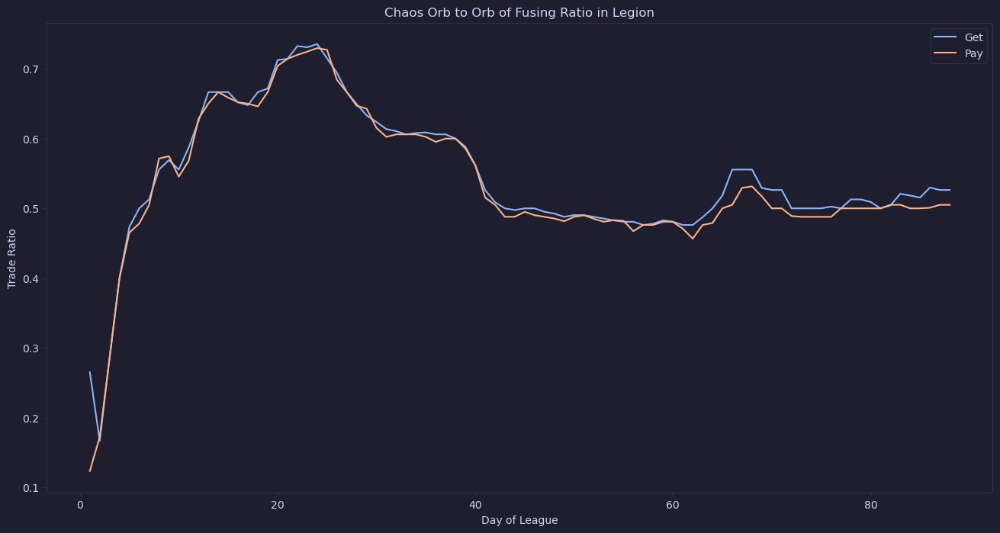

In [7]:
league = 'Legion'
currency = 'Orb of Fusing'
df = league_df(league, currency)
df = trade_ratio(df)
df = league_day(df)

plt.figure(figsize=(16,8))
plt.plot(
    df[df['Get'] == currency]['Day'],
    df[df['Get'] == currency]['Ratio'],
    label = 'Get'
)
plt.plot(
    df[df['Pay'] == currency]['Day'],
    df[df['Pay'] == currency]['Ratio'],
    label = 'Pay'
)

plt.title(f'Chaos Orb to {currency} Ratio in {league}')
plt.xlabel('Day of League')
plt.ylabel('Trade Ratio')
plt.legend()
plt.show;

Here we can see the use of the `average_ratio()` function, which will take the average of the the `Get` ratio and `Pay` ratio. We can use this as the trade ratio for any particular league.

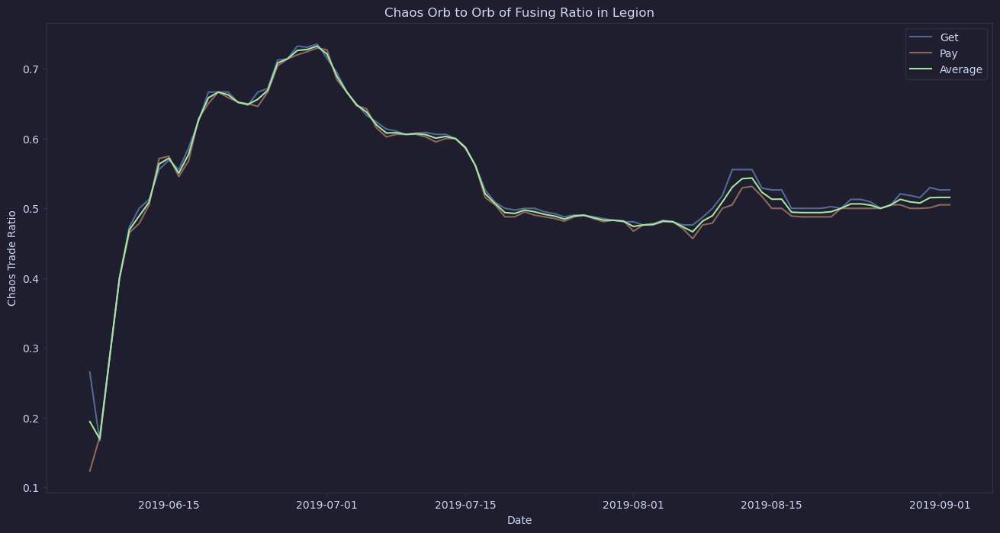

In [8]:
league = 'Legion'
currency = 'Orb of Fusing'
df = league_df(league, currency)
df = trade_ratio(df)

plt.figure(figsize=(16,8))
plt.plot(
    df[df['Get'] == currency]['Date'],
    df[df['Get'] == currency]['Ratio'],
    alpha = 0.5,
    label = 'Get'
)
plt.plot(
    df[df['Pay'] == currency]['Date'],
    df[df['Pay'] == currency]['Ratio'],
    alpha = 0.5,
    label = 'Pay'
)

df = average_ratio(df)
plt.plot(
    df['Date'],
    df['Ratio'],
    label = 'Average'
)

plt.title(f'Chaos Orb to {currency} Ratio in {league}')
plt.legend()
plt.xlabel('Date')
plt.ylabel('Chaos Trade Ratio')
plt.show;

## Challenge Leagues

Challenge leagues are temporary leagues that exist for around 3 months and then delete themselves and push all the existing characters, loot, and progression into the permanent Stanard league. Read more about the topic [here](https://www.poewiki.net/wiki/League#Challenge_leagues)

In this project we will be studying the values of the currencies dropped by the bosses in the game known as the [Conquerors](https://www.poewiki.net/wiki/Conquerors). We structure all our code so that we can just run for loops over a list of the currencies we care about and get the desired output for each currency.

In [9]:
# List of the Currencies we will be studying.
currencies = ["Hunter's Exalted Orb", "Crusader's Exalted Orb", "Redeemer's Exalted Orb", "Warlord's Exalted Orb", "Awakener's Orb"]

### Trade Ratios Over Time

Here we will graph the values of these currencies through out a leagues life span. We will look at the league naturally, with a moving average, and look at the changes in differencing and the differencing of differencing.

In [10]:
def league_start_graph(currency, rolling=0, diffs=0):
    '''
    This function produces plots for all the league starts (where data exists) for a specified currency
    and takes in arguements for moving average and differencing.
    
    currency: Currency to be graphed
    rolling: default = 0. If greater than 0, the function uses that as the window arguement for a moving
        average transformation.
    diffs: default = 0. If greater than 0, the function will difference the data that many times. 
    '''
    path = '../leagues/'
    plt.figure(figsize=(16,8))
    
    for league in os.listdir(path):
        color = load_color("mocha", random.choice(cat_color))
        df = league_df(league, currency)
        if df.empty:
            continue
        df = trade_ratio(df)
        df = average_ratio(df)
        df = league_day(df)
        
        if rolling>0:
            df['Ratio'] = df['Ratio'].rolling(window=rolling).mean(numeric_only=True)
            
        if diffs>0:
            for i in range(0, diffs):
                df['Ratio'] = df['Ratio'].diff()

        plt.plot(
            df['Day'],
            df['Ratio'],
            label = league,
            color = color
        )
   
    if rolling>0:
        roll_str = f' Moving Average ({rolling})'
    else:
        roll_str = ''
        
    diffs_str = ''
    
    if diffs>0:
        for i in range(0, diffs):
            diffs_str += 'Differenced '
            
    plt.title(f'Chaos Orb to {currency}{roll_str} {diffs_str}Ratio in all leagues')
    plt.xlabel('Day of League')
    plt.ylabel('Chaos Trade Ratio')
    plt.legend()
    
    if rolling>0:
        plt.savefig(f'../images/{currency}_moving_all_leagues.png')
    elif diffs>0:
        for i in range(0, diffs):
            diffs_str = 'diff_'
        plt.savefig(f'../images/{currency}_{diffs_str}all_leagues.png')
    else:
        plt.savefig(f'../images/{currency}_all_leagues.png')
    
    plt.show;

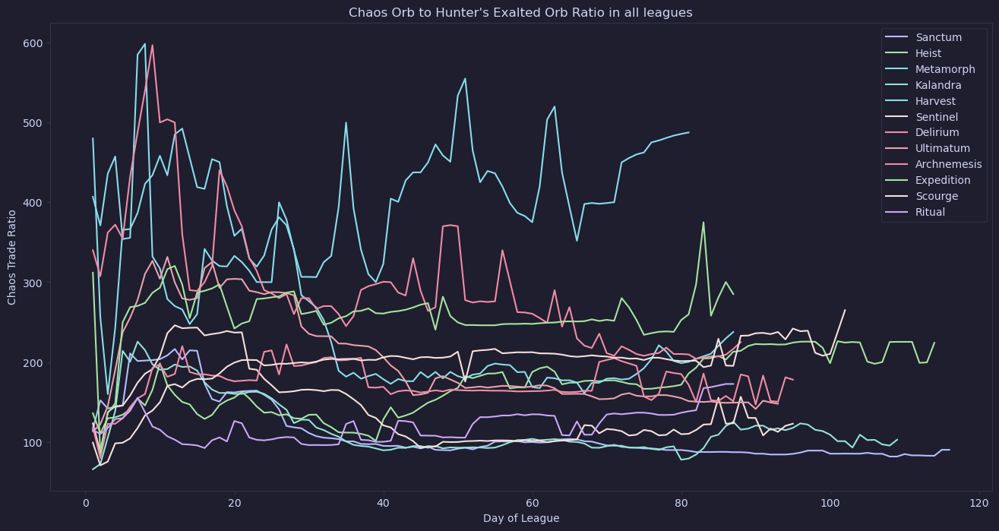

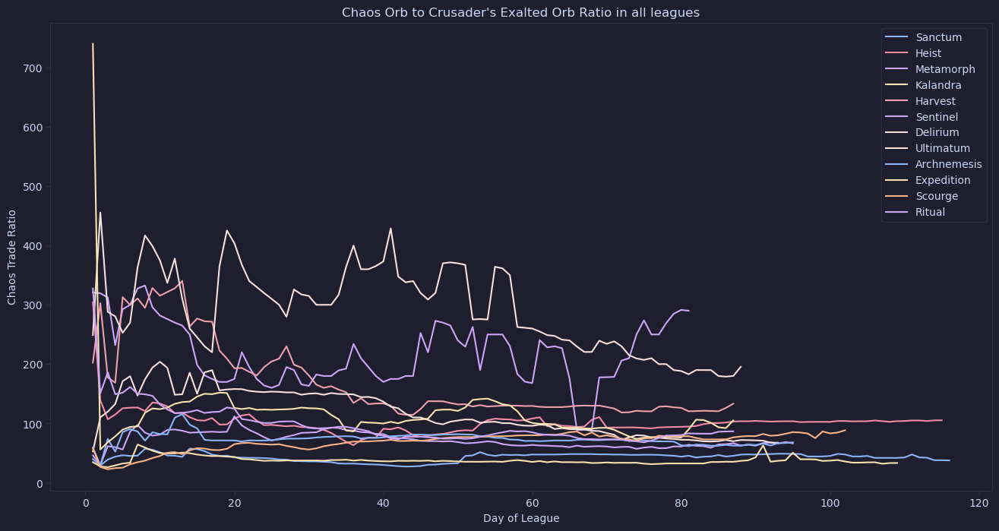

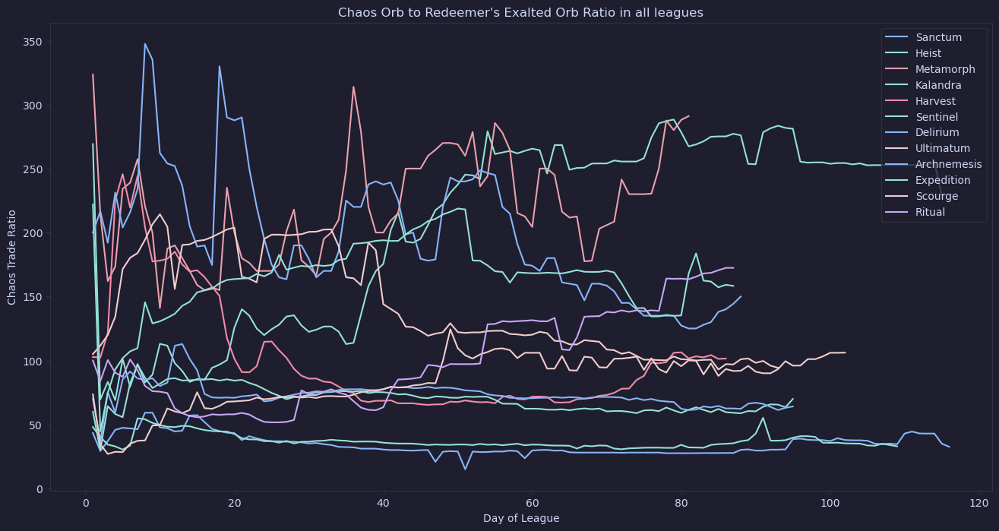

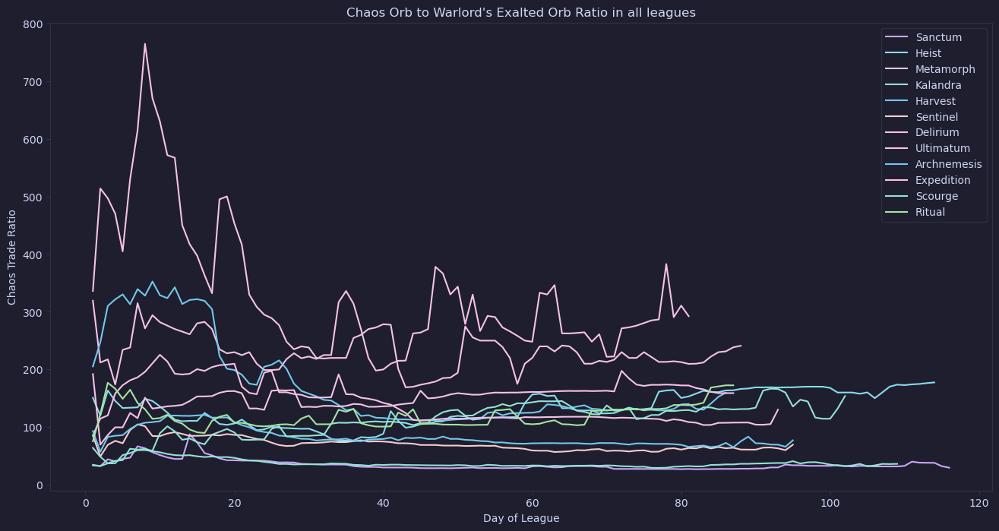

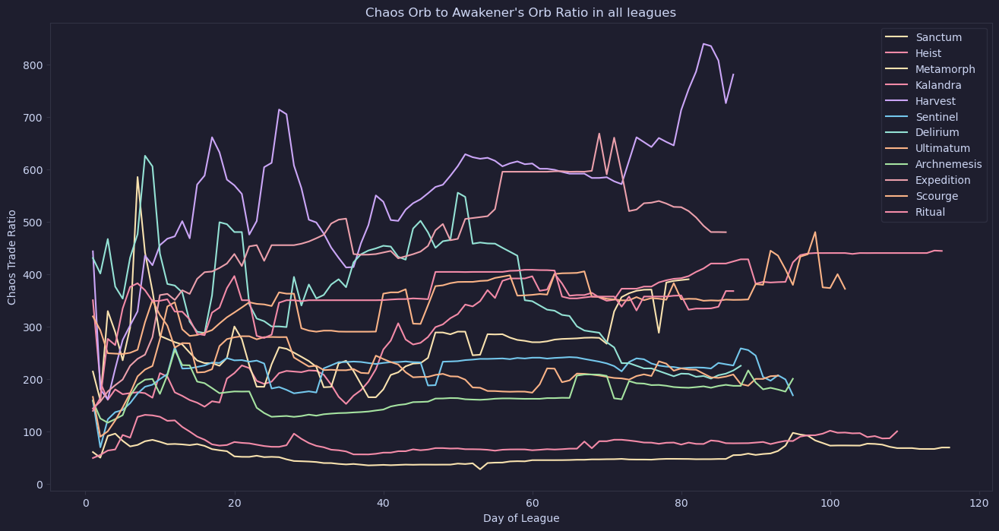

In [11]:
for currency in currencies:
    league_start_graph(currency)

### Trade Ratio Moving Average Over Time

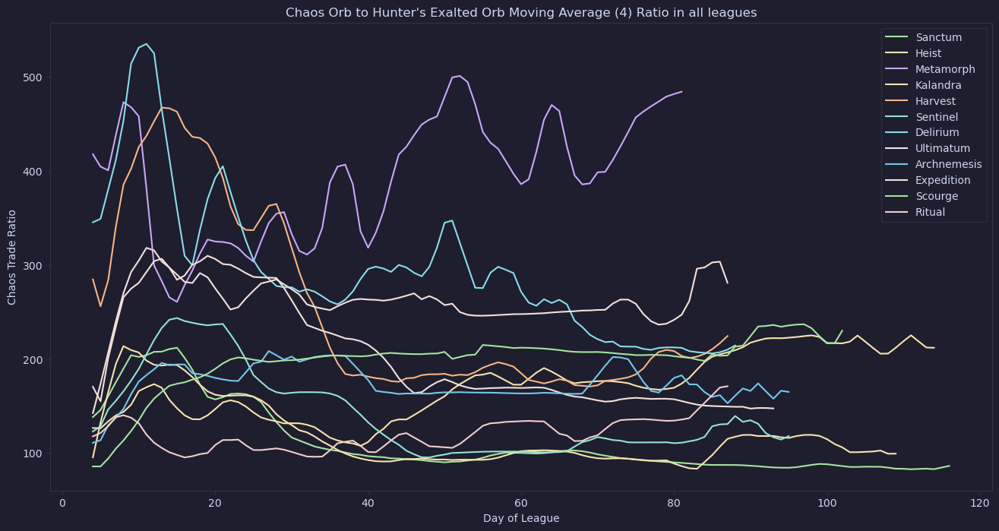

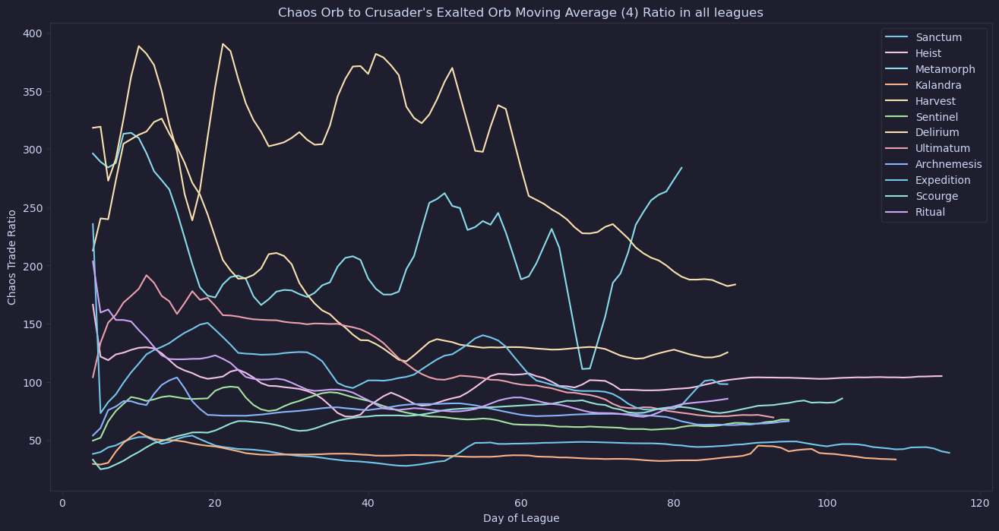

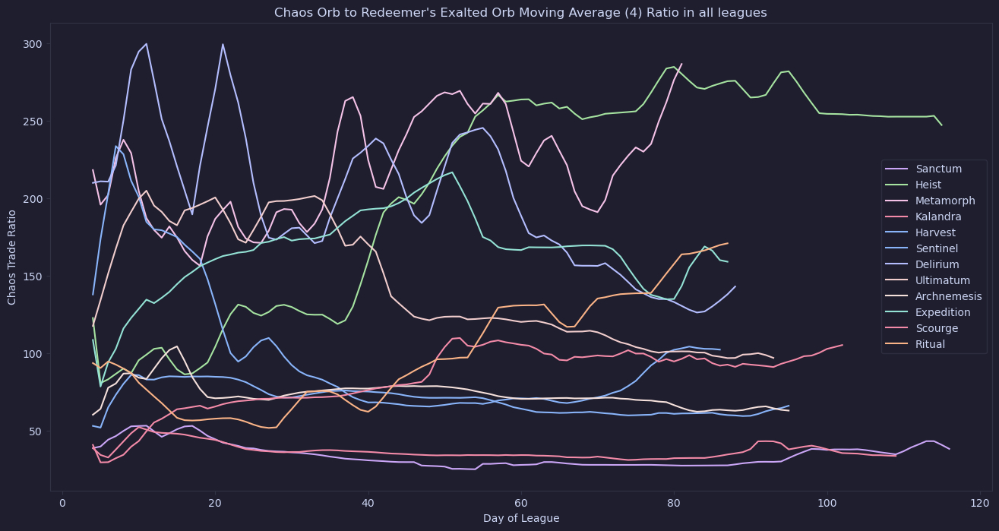

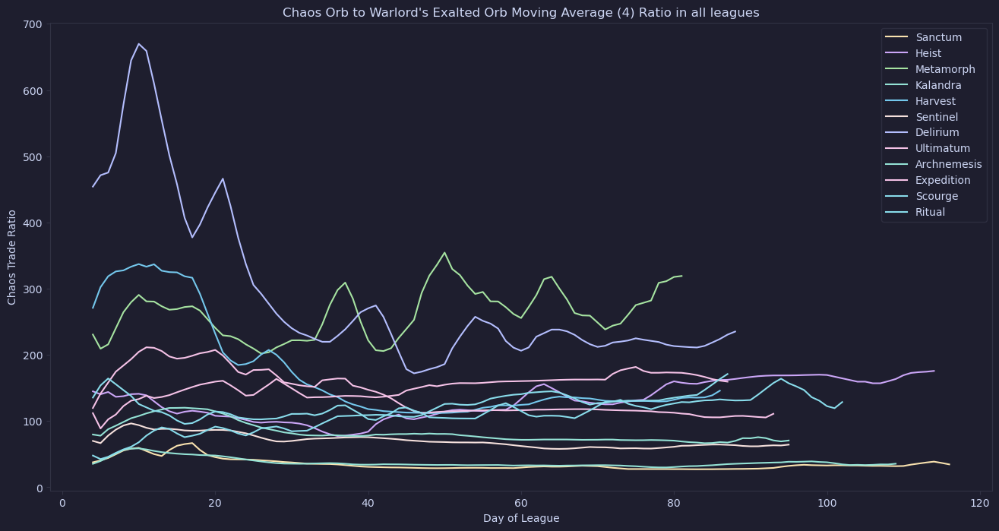

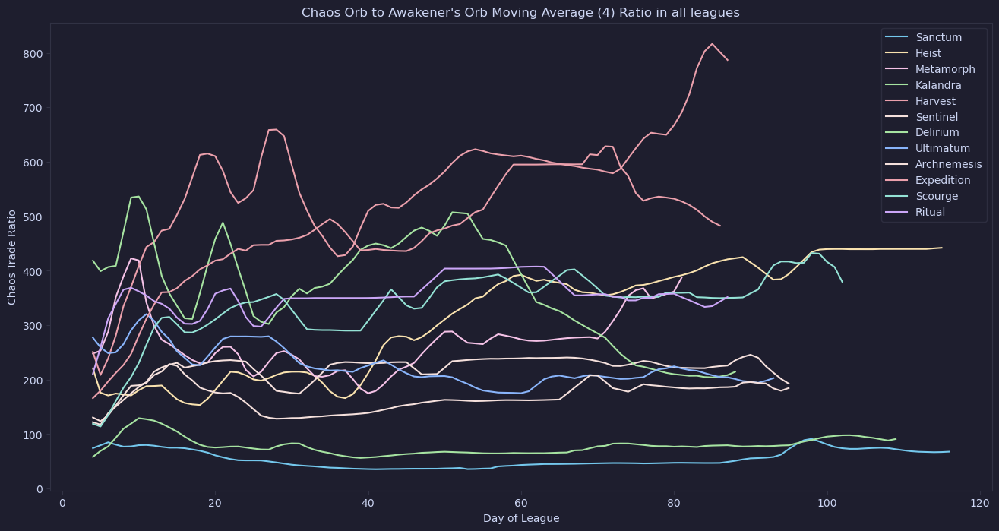

In [12]:
for currency in currencies:
    league_start_graph(currency, rolling=4)

### Trade Ratio Differencing Over Time

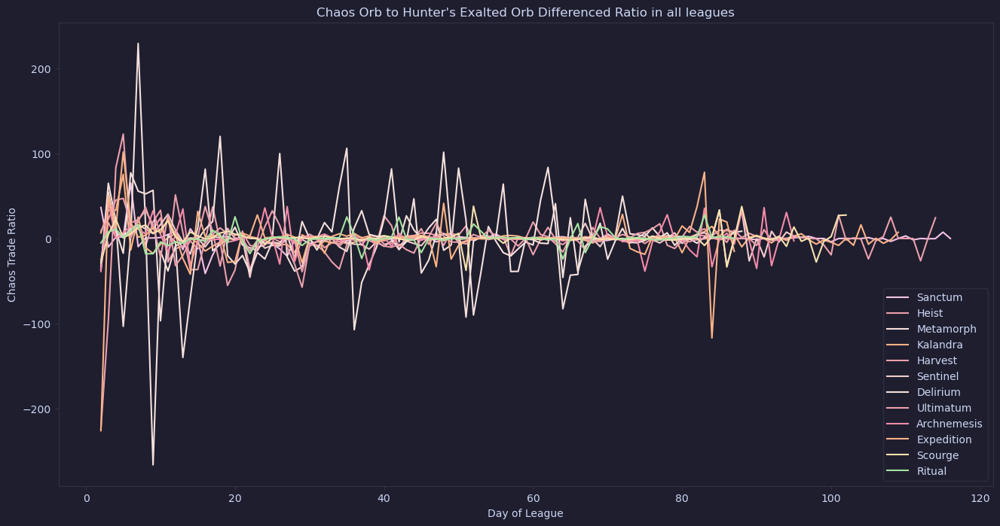

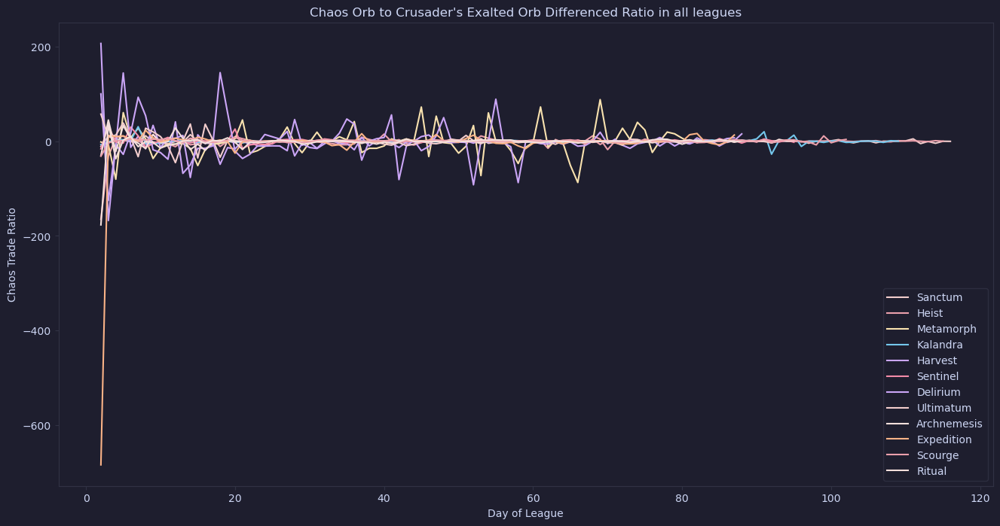

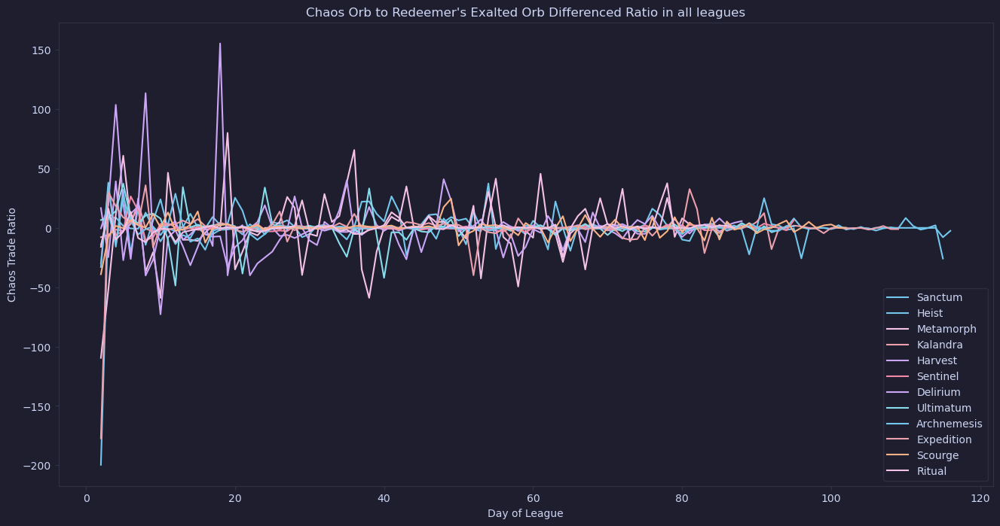

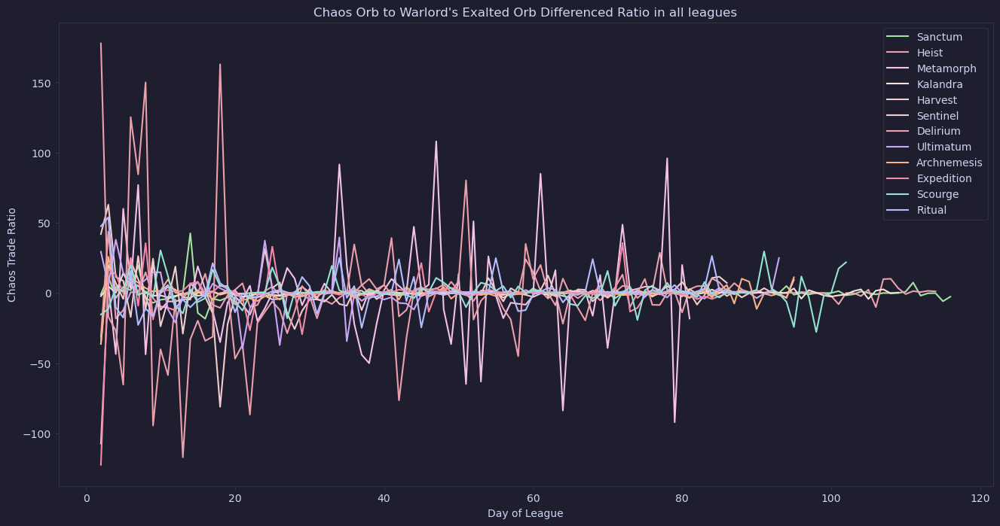

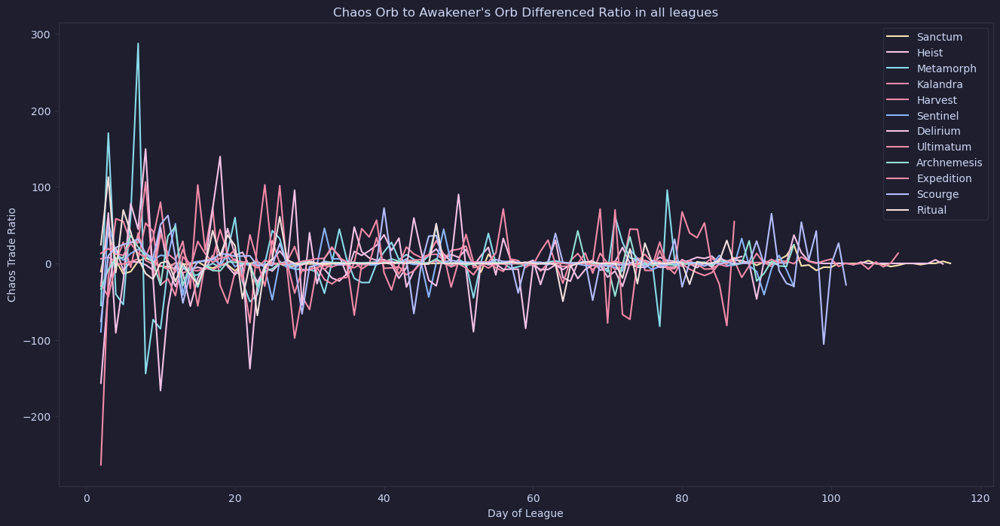

In [13]:
for currency in currencies:
    league_start_graph(currency, diffs=1)

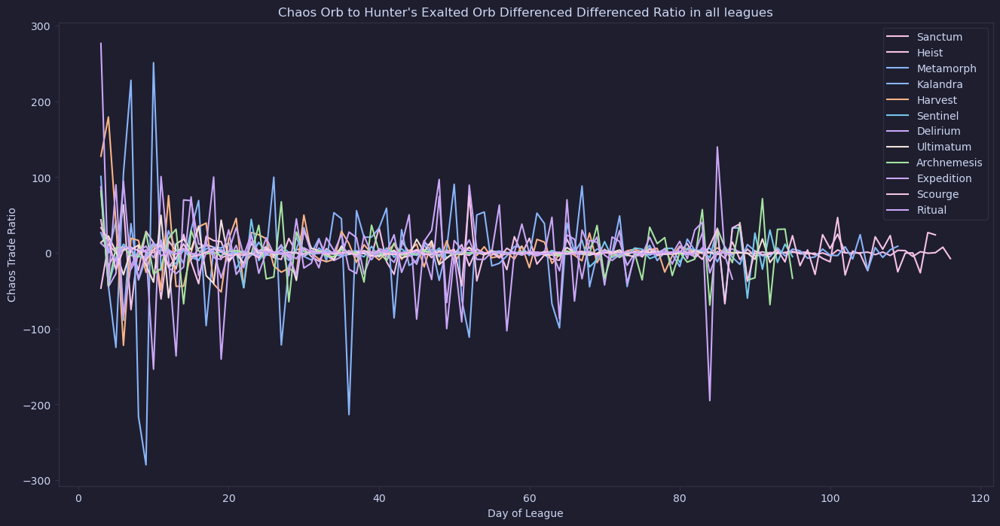

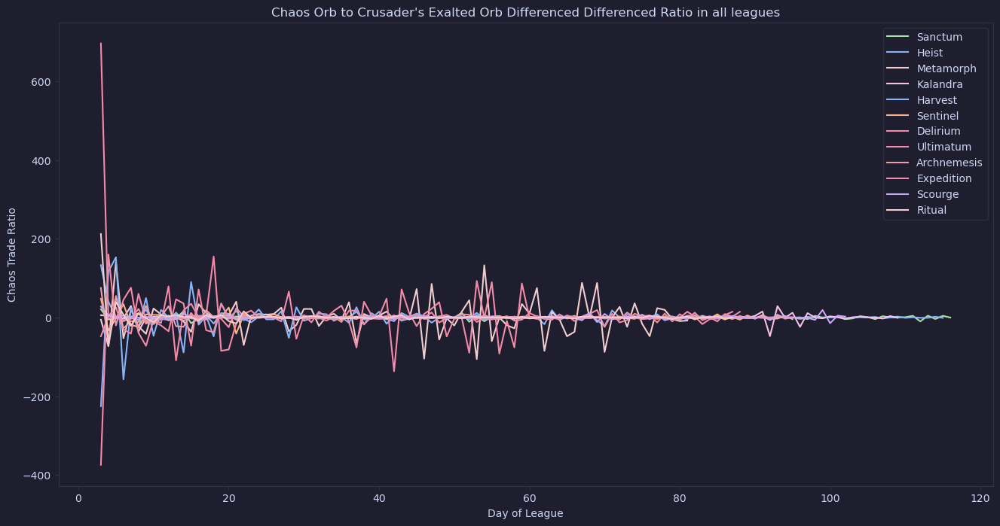

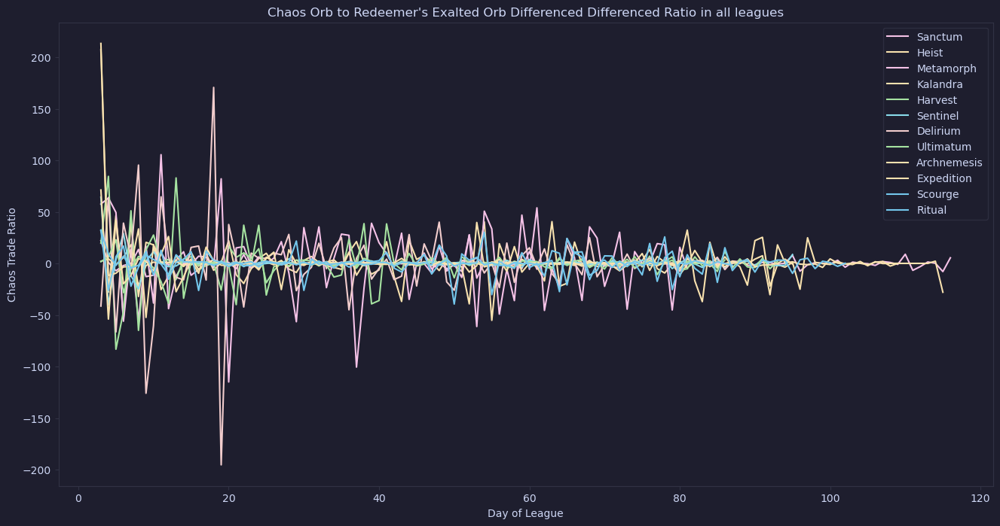

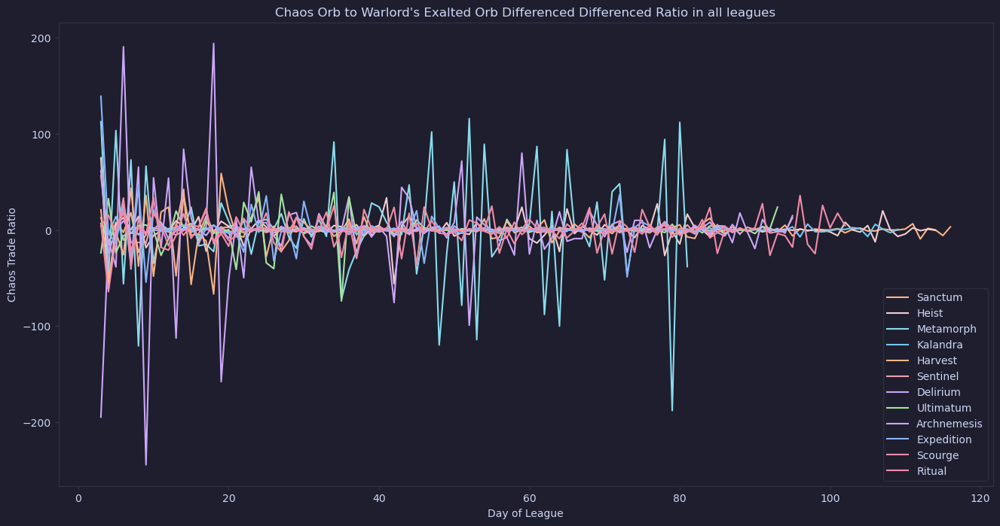

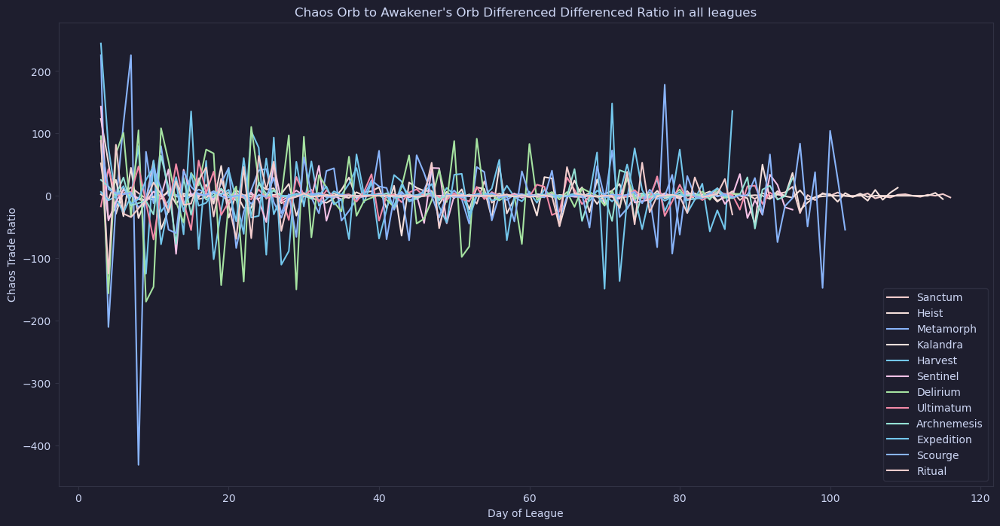

In [14]:
for currency in currencies:
    league_start_graph(currency, diffs=2)

As we can see the values of the currencies follow no real constant pattern each league. The way the value shifts over a league is always different. Trying to find an investing strategy based purely on the day of the league seems to be a pointless endeavor.

Next let us look at the correlation the value of a currency has with it's previous values. 

In [15]:
def league_auto_correlation(currency, lags=50):
    '''
    This function plots the Auto Correlation Function Graph for a specified currency for each Challenge League
    
    currency: Specified Currency.
    lags: default = 50. The number of lags the function should look through.
    '''
    path = '../leagues/'
    plt.figure(figsize=(16,8))
    
    for league in os.listdir(path):
        color = load_color("mocha", random.choice(cat_color))
        df = league_df(league, currency)
        if df.empty:
            continue
        df = league_df(currency=currency)
        df = trade_ratio(df)
        df = average_ratio(df)
        df.set_index('Date', inplace=True)
        df.sort_index(inplace=True)
        df = df.resample('W').mean()
        
        plot_acf(df['Ratio'], lags = lags, title=f'Autocorrelation of {currency} for {league}');

/home/ys/anaconda3/envs/env39/lib/python3.9/site-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


<Figure size 1600x800 with 0 Axes>

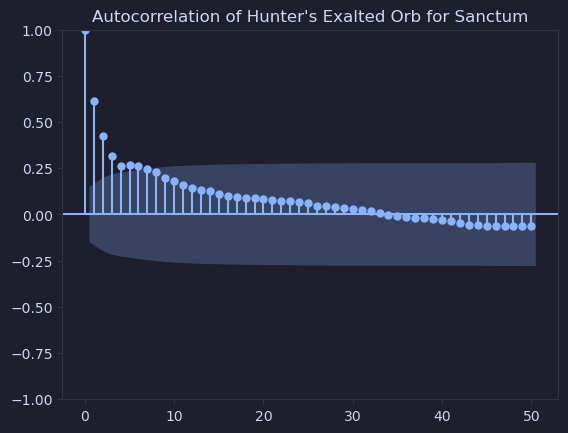

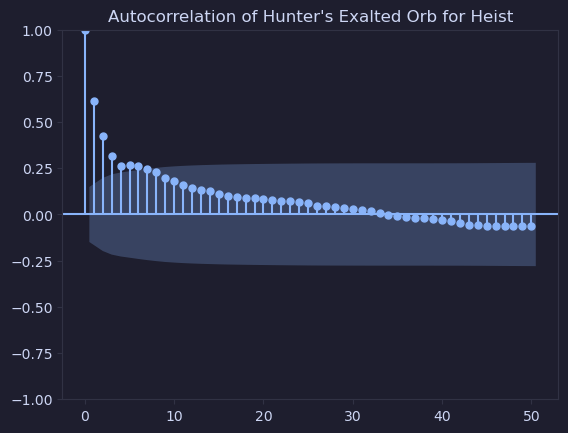

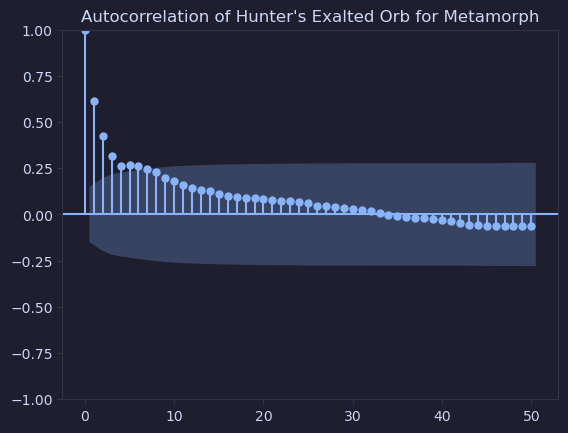

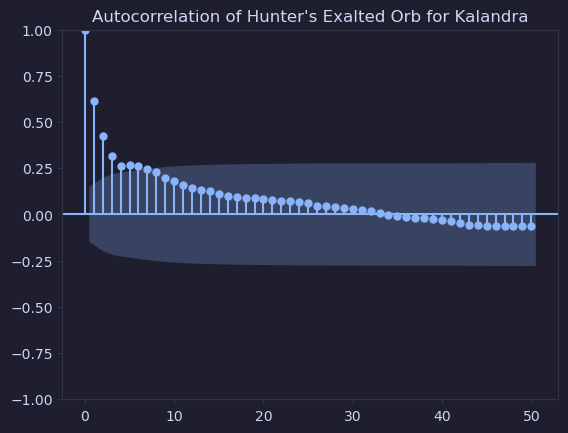

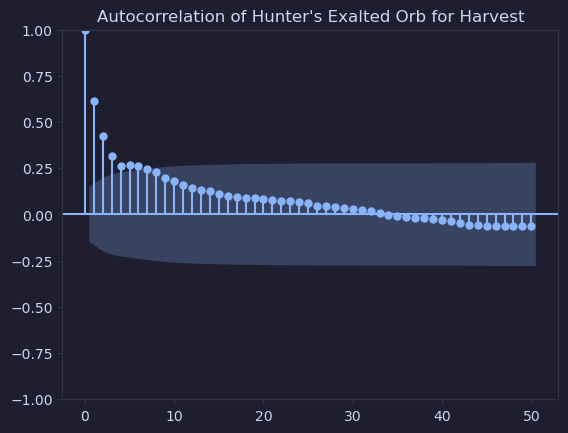

...

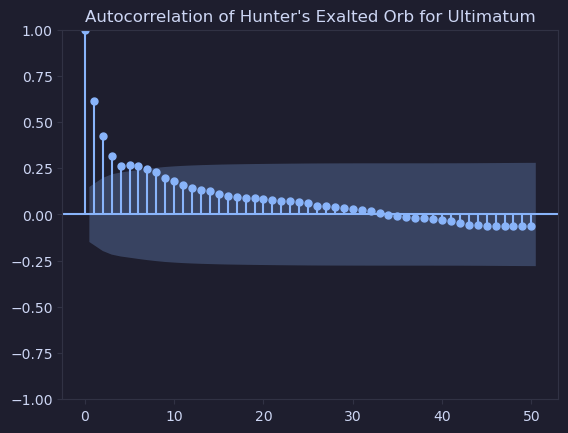

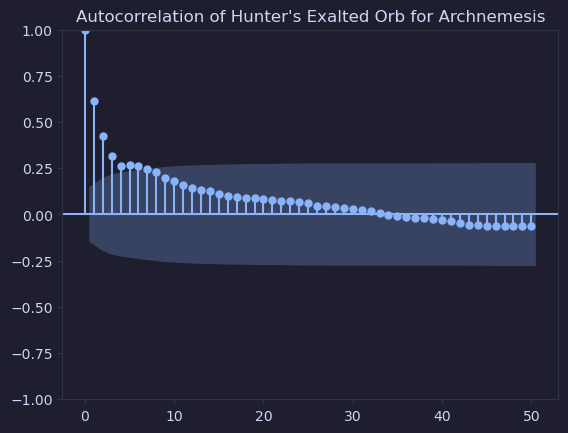

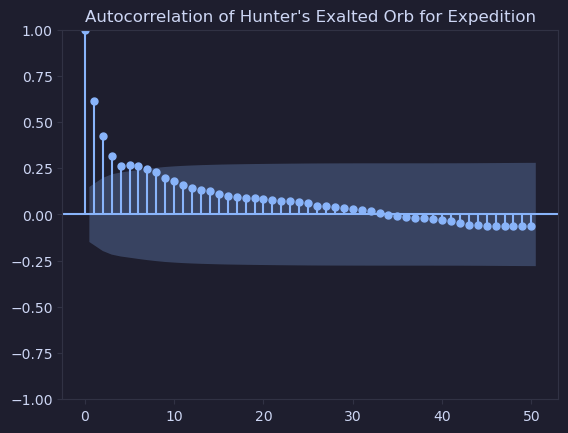

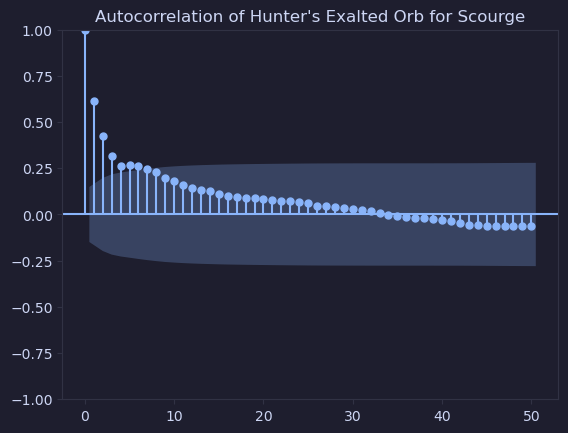

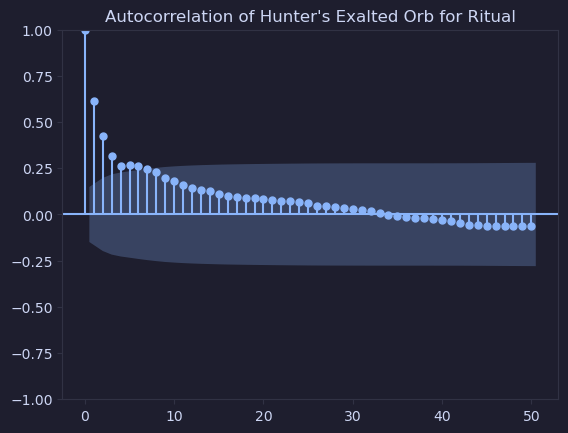

<Figure size 1600x800 with 0 Axes>

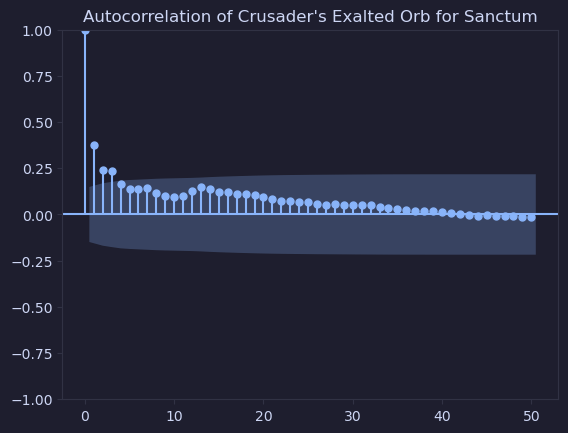

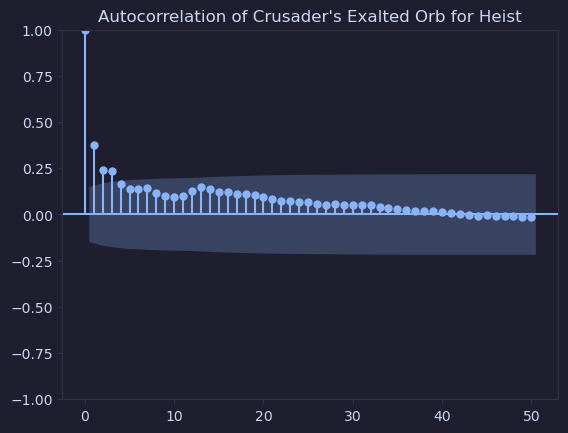

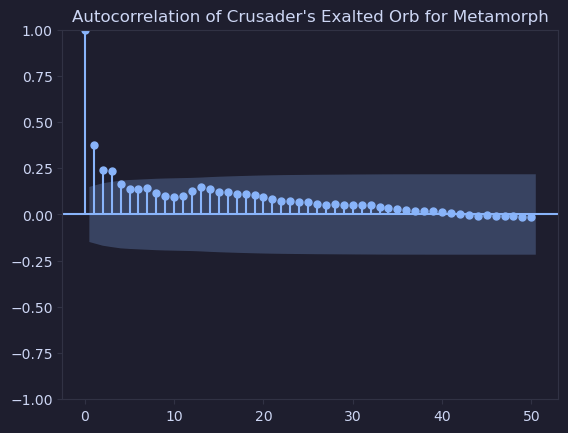

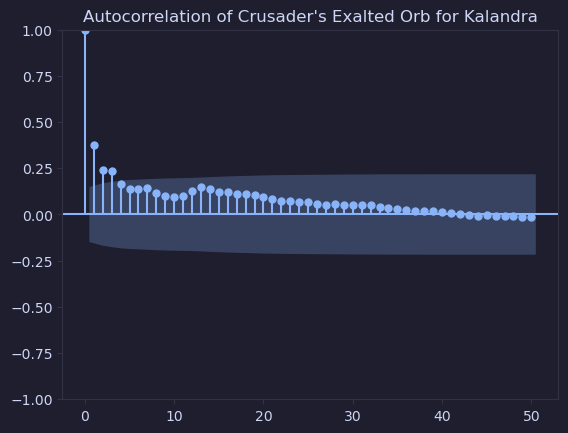

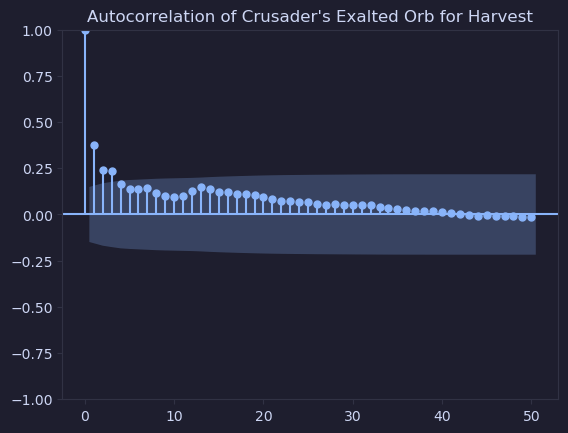

...

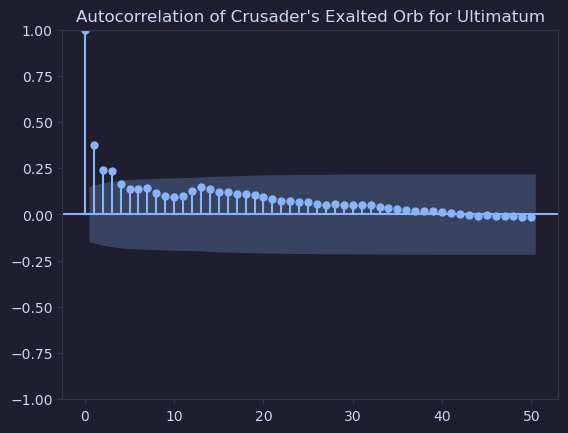

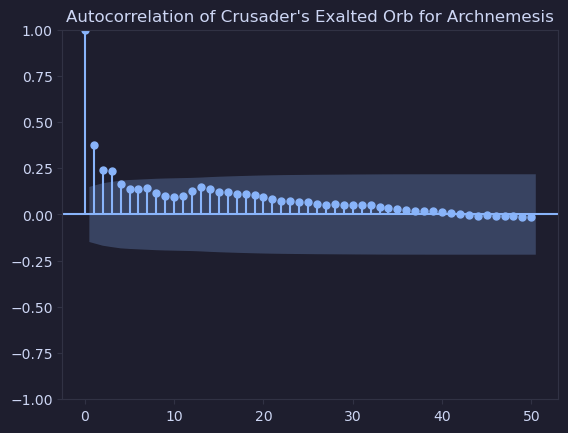

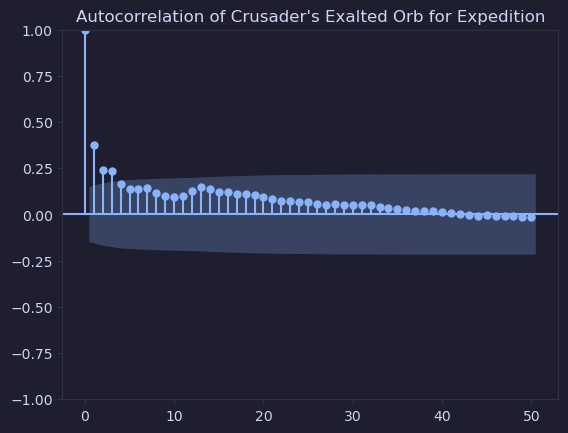

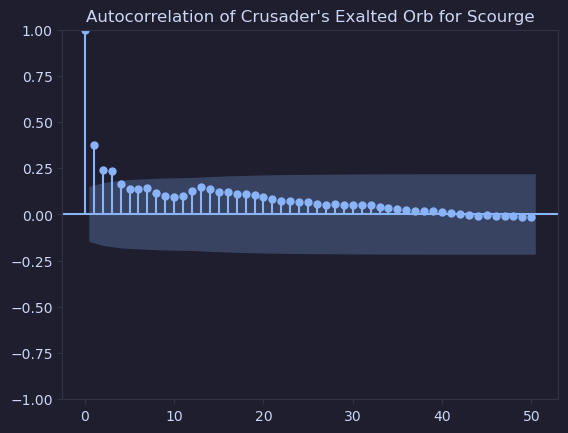

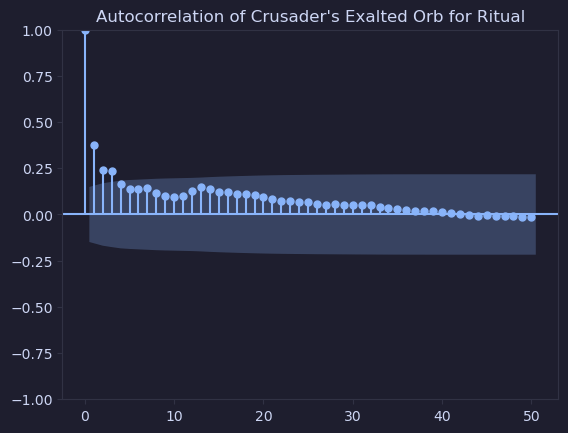

<Figure size 1600x800 with 0 Axes>

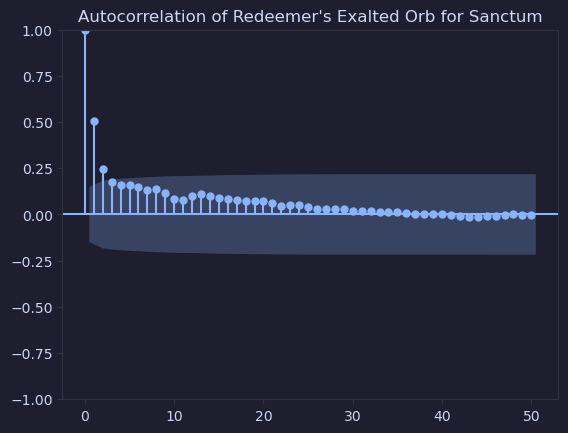

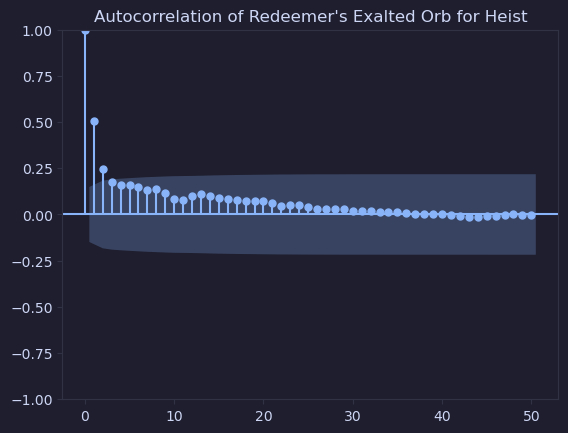

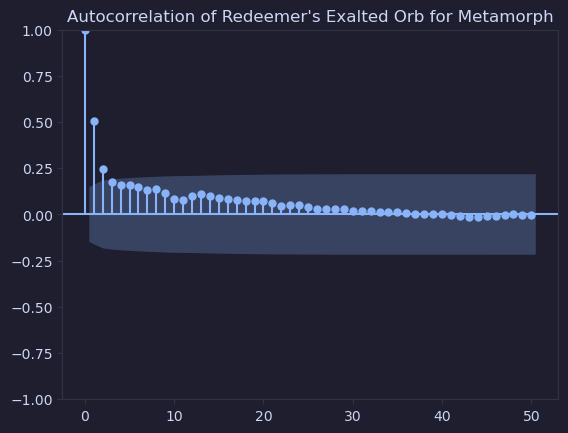

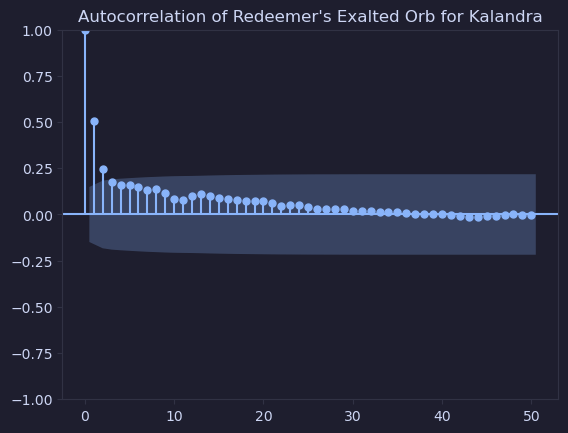

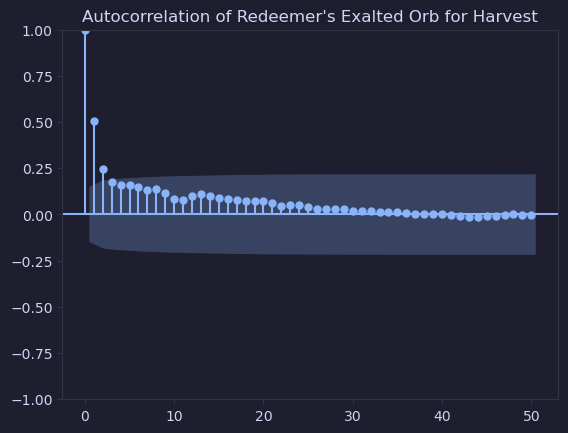

...

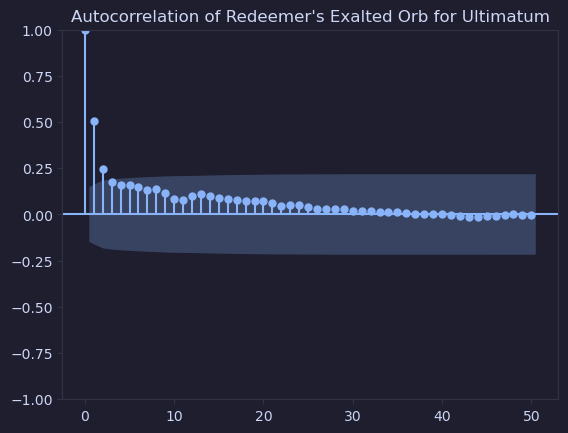

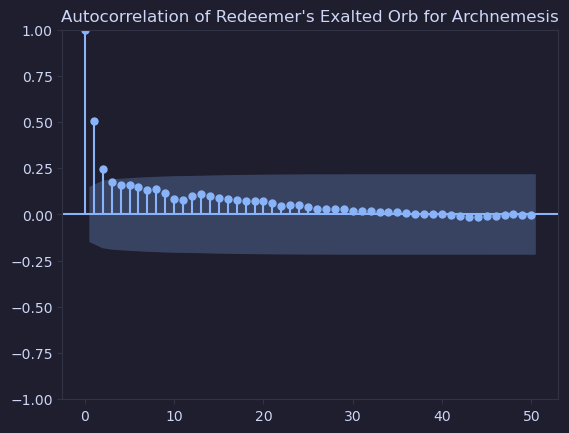

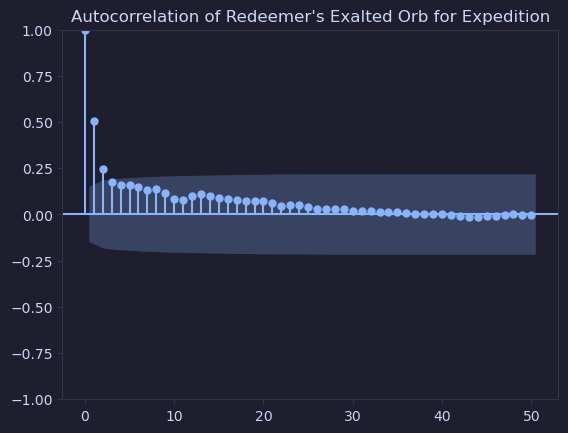

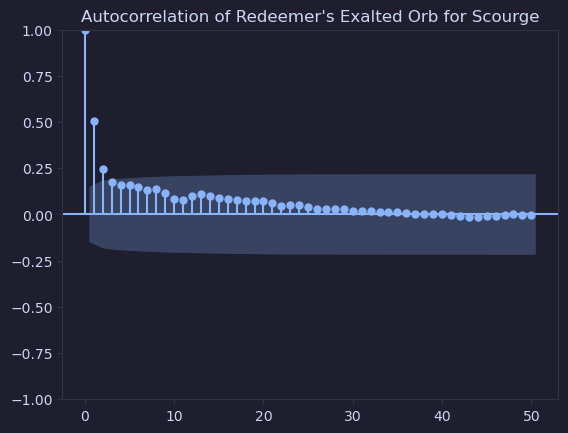

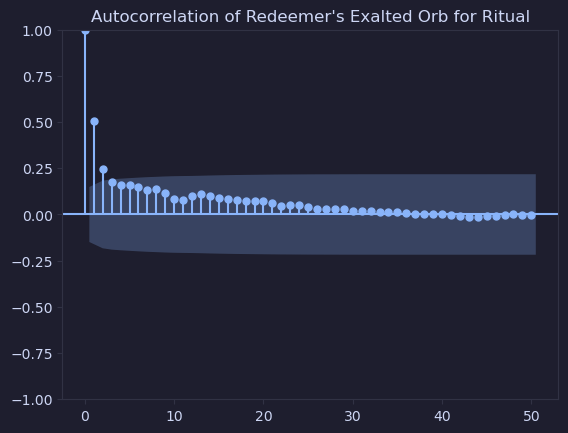

<Figure size 1600x800 with 0 Axes>

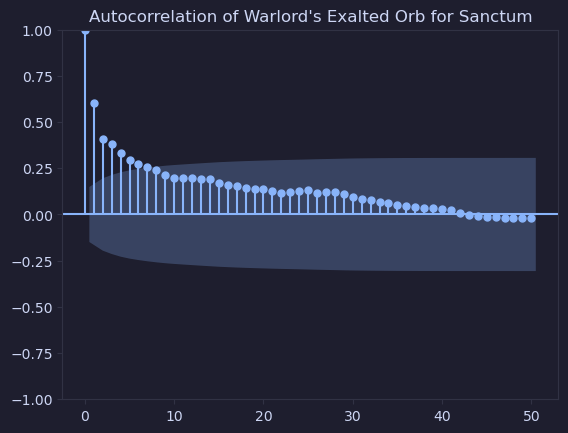

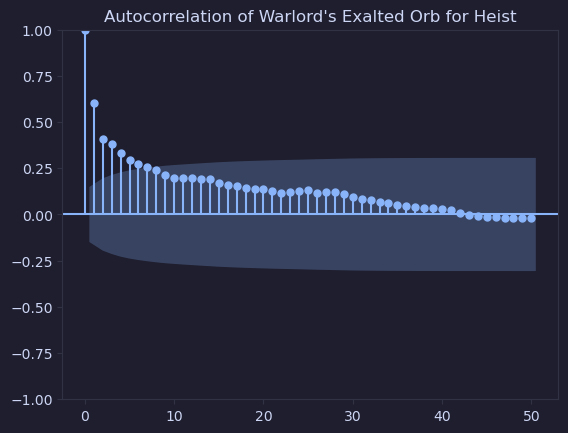

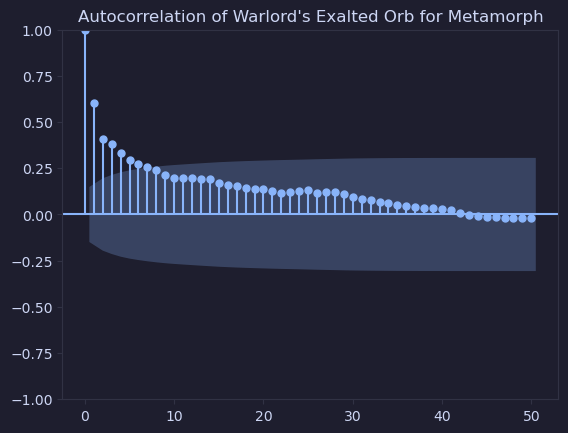

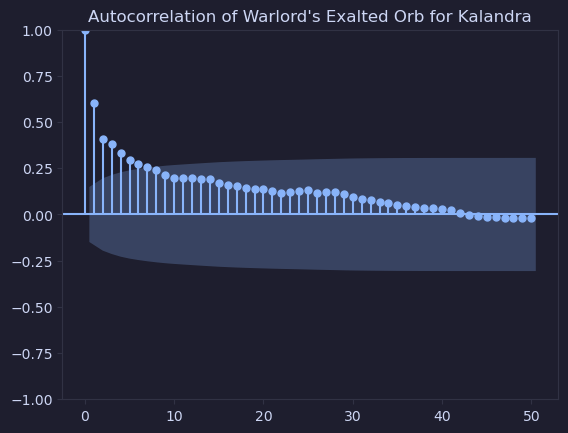

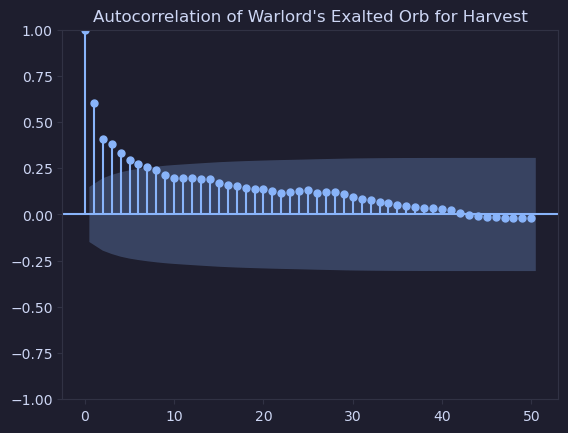

...

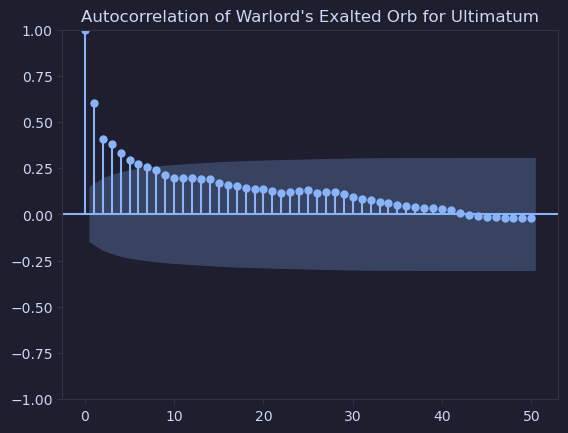

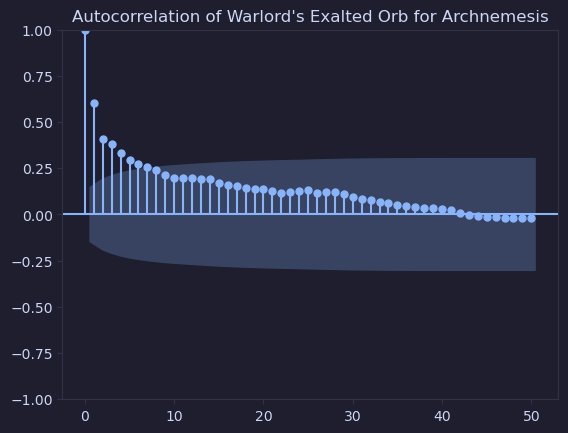

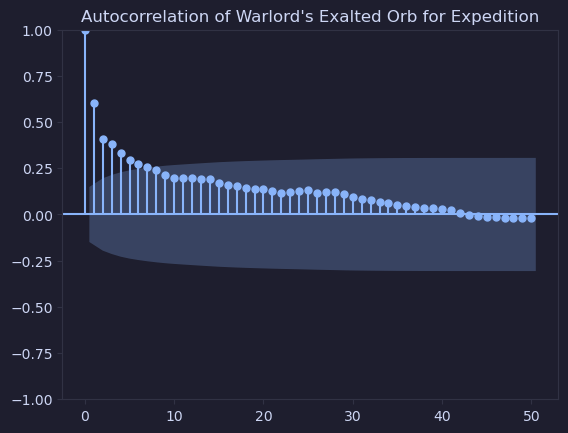

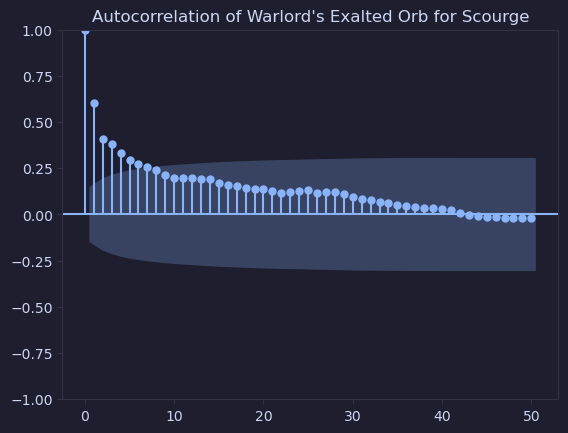

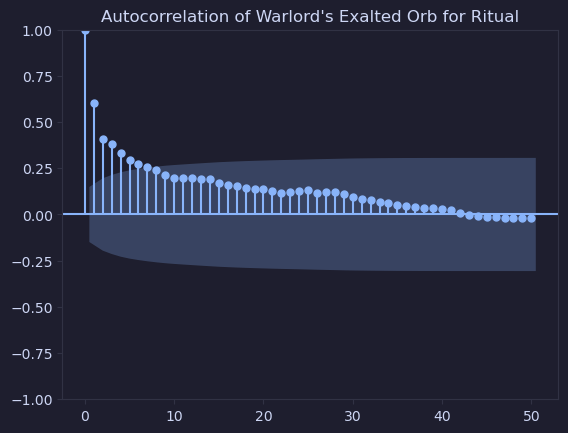

<Figure size 1600x800 with 0 Axes>

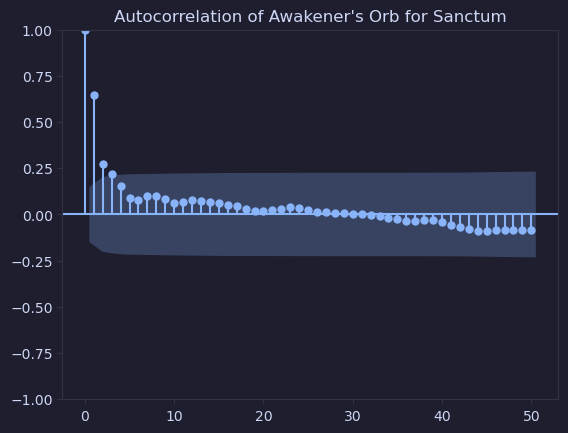

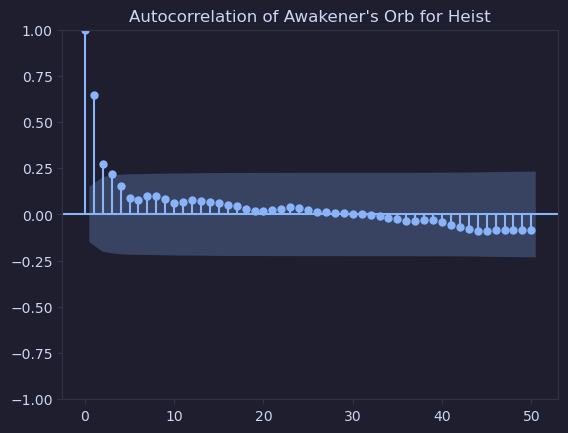

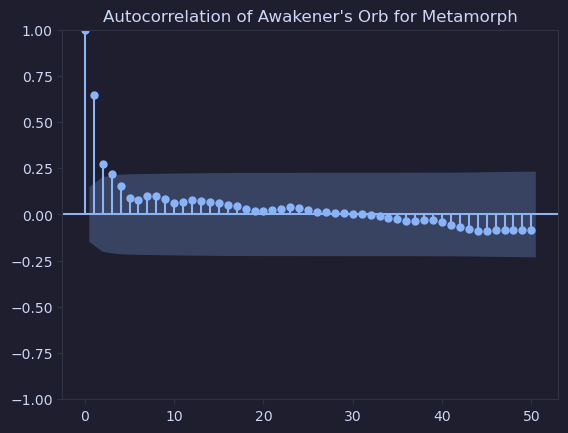

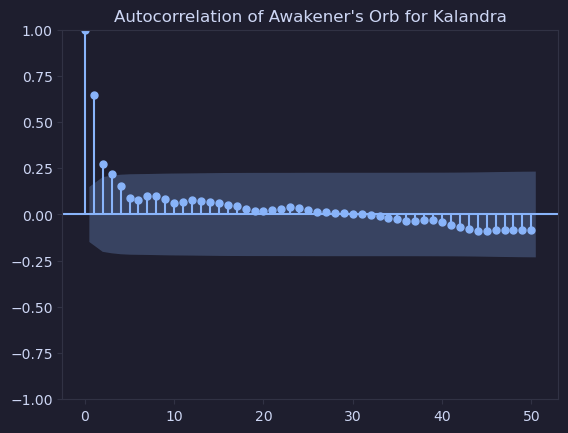

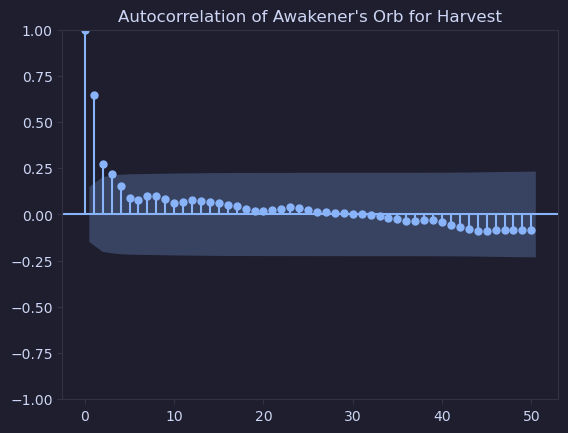

...

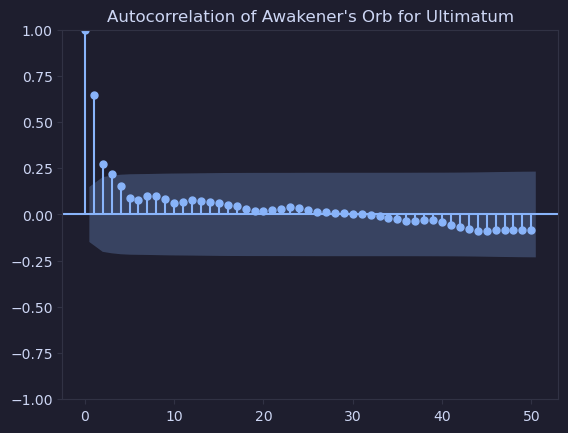

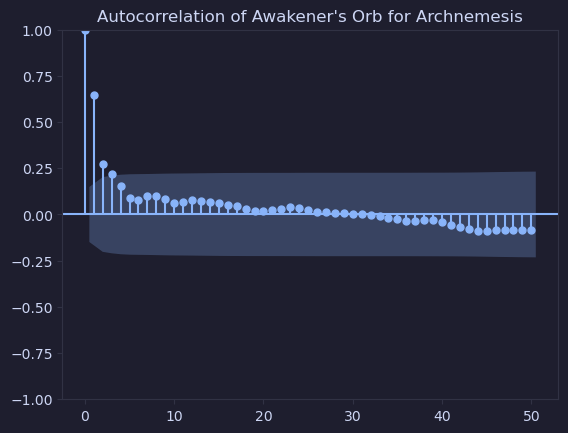

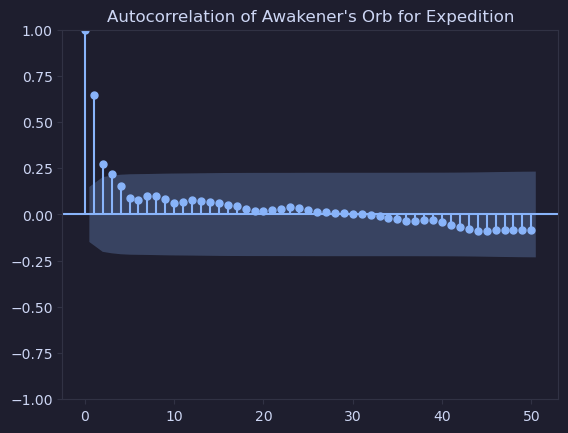

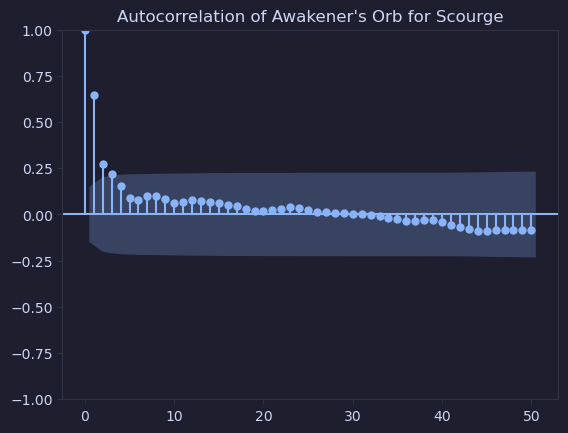

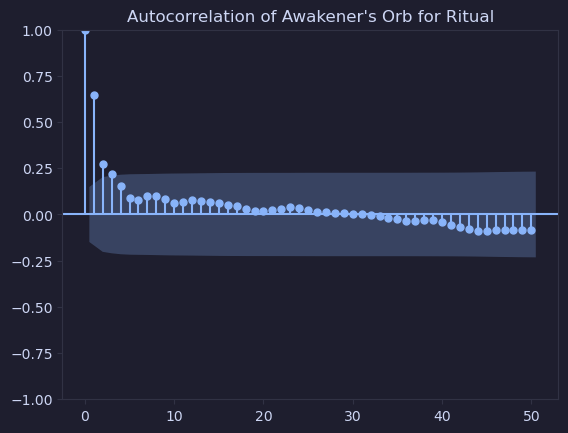

In [16]:
for currency in currencies:
    league_auto_correlation(currency)

In [17]:
def league_partial_auto_correlation(currency, lags=50):
    '''
    This function plots the Partial Auto Correlation Function Graph for a specified currency for each Challenge League
    
    currency: Specified Currency.
    lags: default = 50. The number of lags the function should look through.
    '''
    path = '../leagues/'
    plt.figure(figsize=(16,8))
    
    for league in os.listdir(path):
        color = load_color("mocha", random.choice(cat_color))
        df = league_df(league, currency)
        if df.empty:
            continue
        df = league_df(currency=currency)
        df = trade_ratio(df)
        df = average_ratio(df)
        df.set_index('Date', inplace=True)
        df.sort_index(inplace=True)
        df = df.resample('W').mean()
        
        plot_pacf(df['Ratio'], lags = lags, method = 'ywm', title=f'Partial Autocorrelation of {currency} for {league}');

/home/ys/anaconda3/envs/env39/lib/python3.9/site-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


<Figure size 1600x800 with 0 Axes>

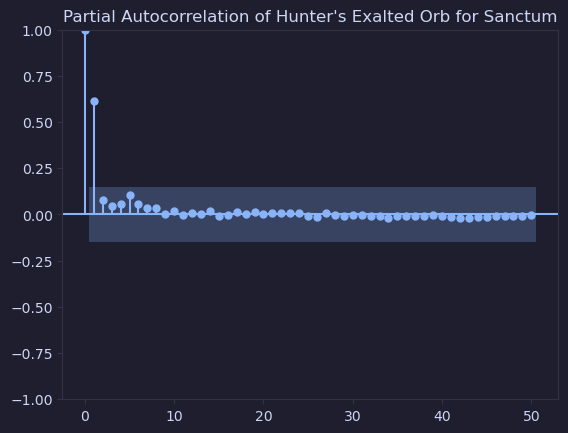

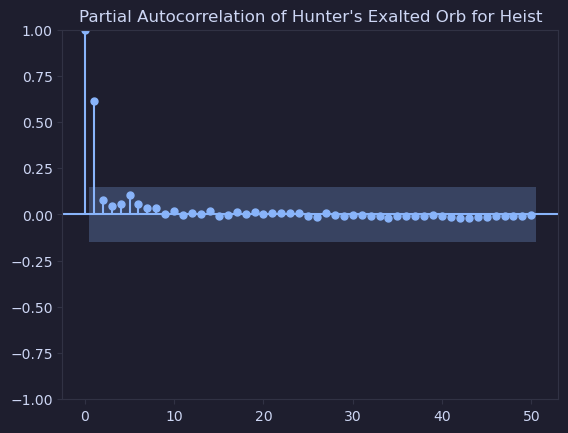

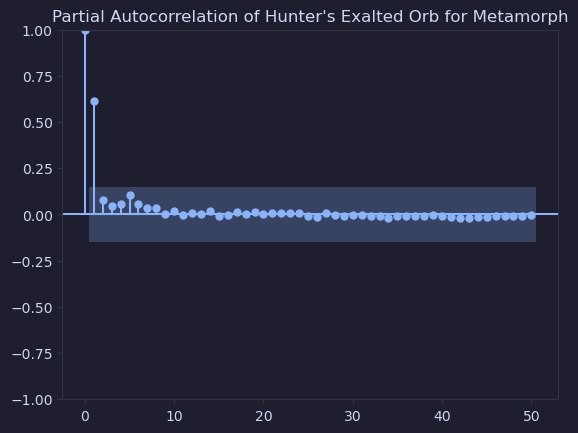

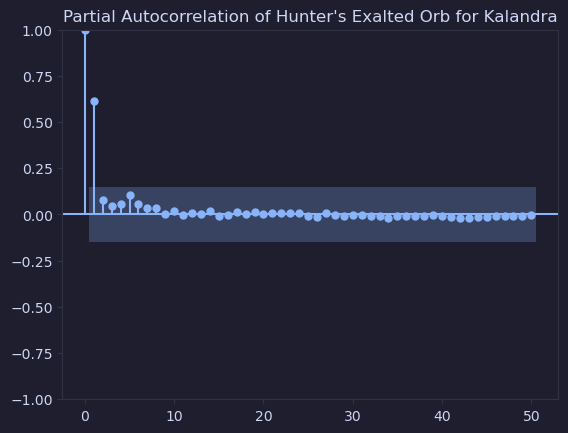

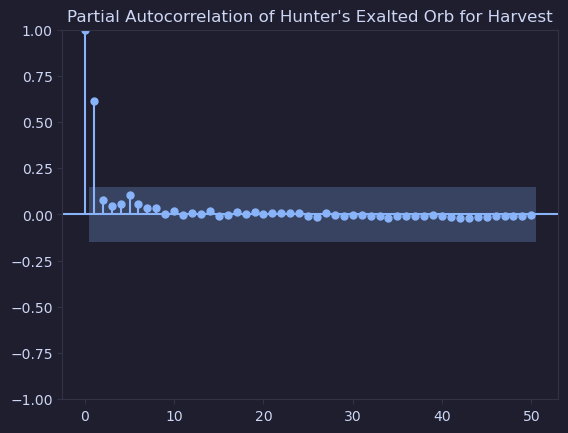

...

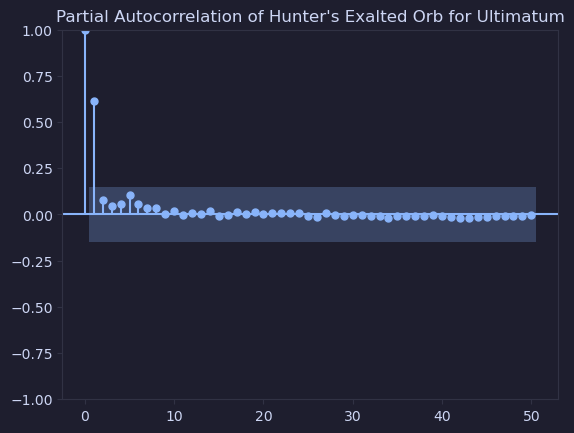

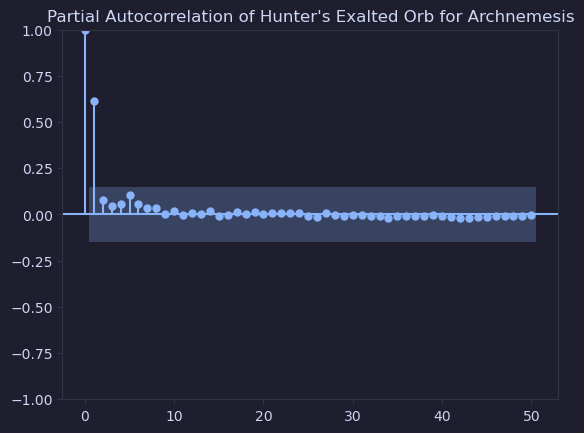

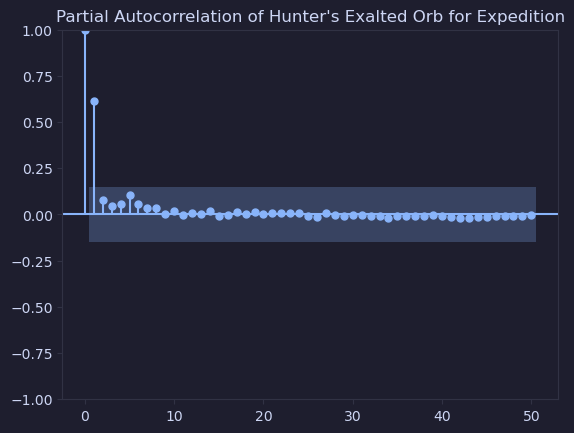

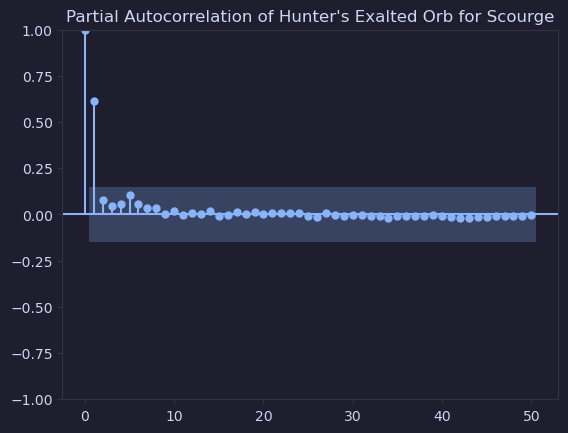

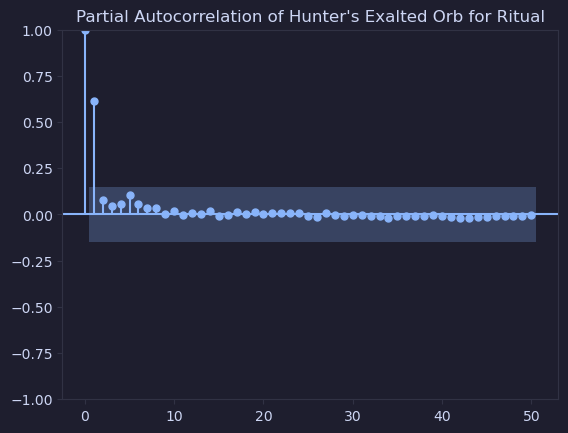

<Figure size 1600x800 with 0 Axes>

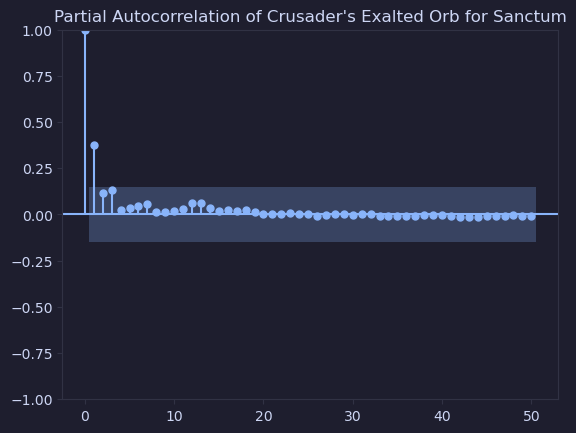

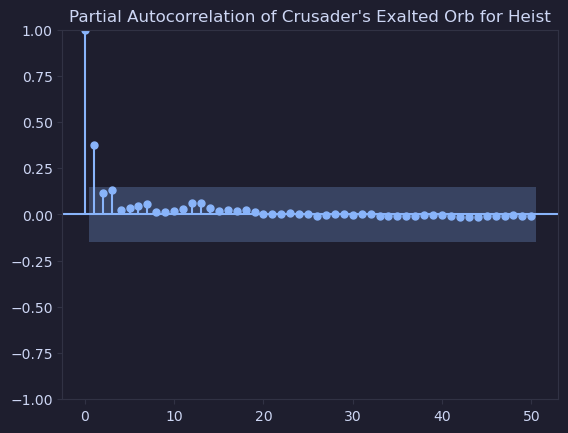

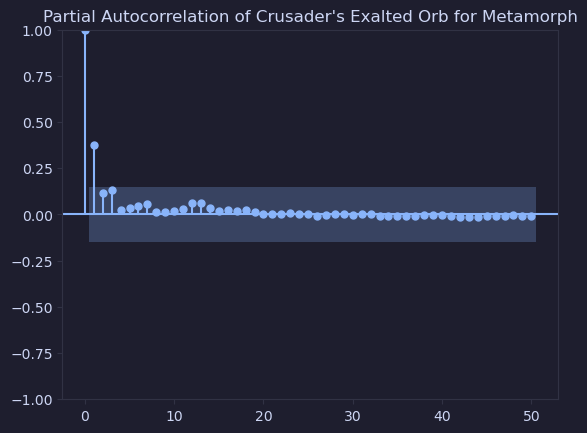

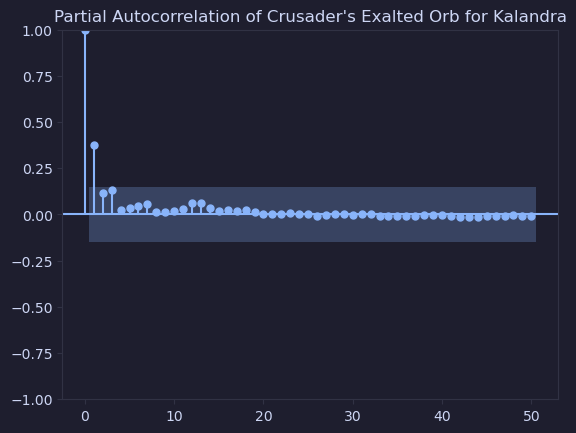

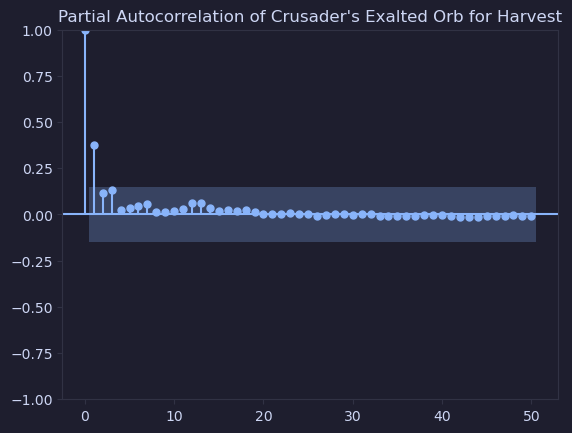

...

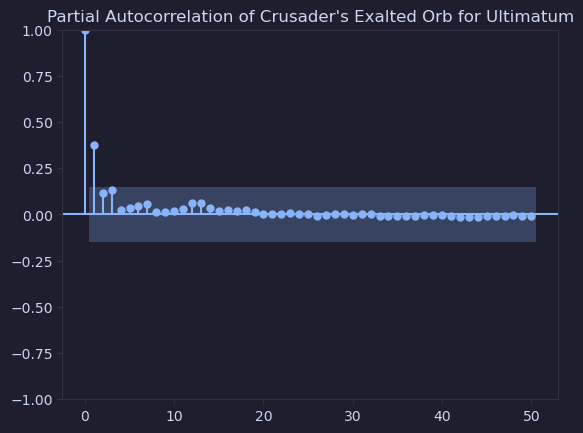

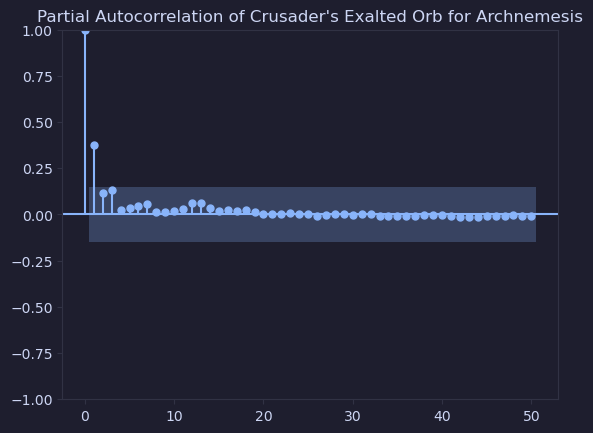

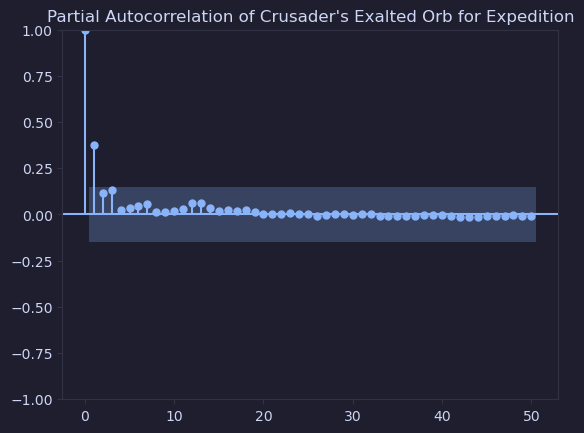

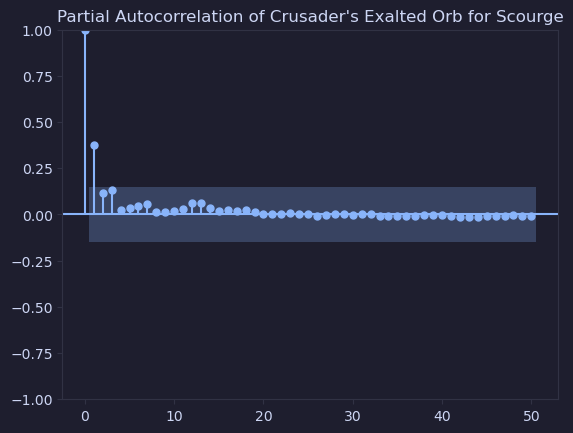

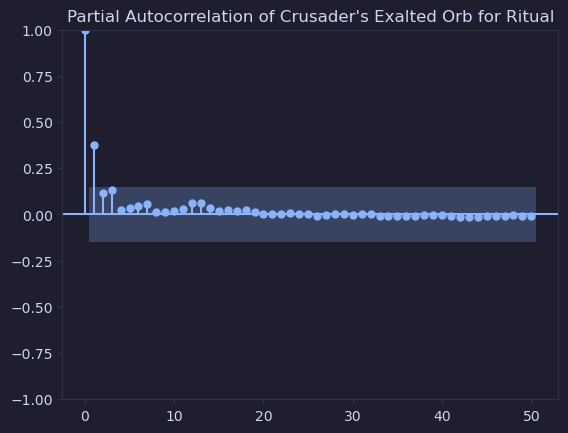

<Figure size 1600x800 with 0 Axes>

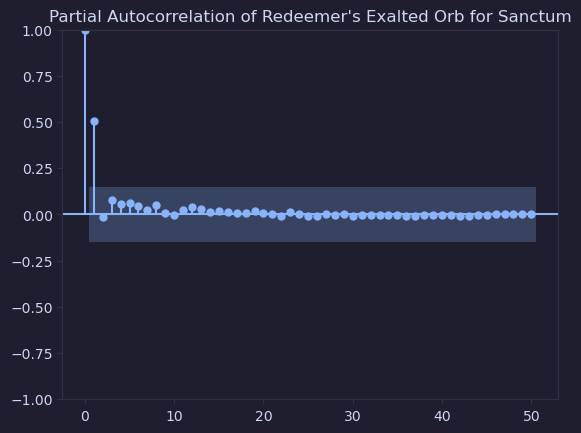

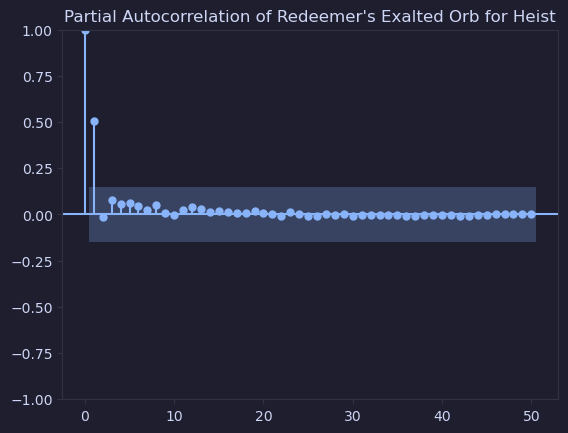

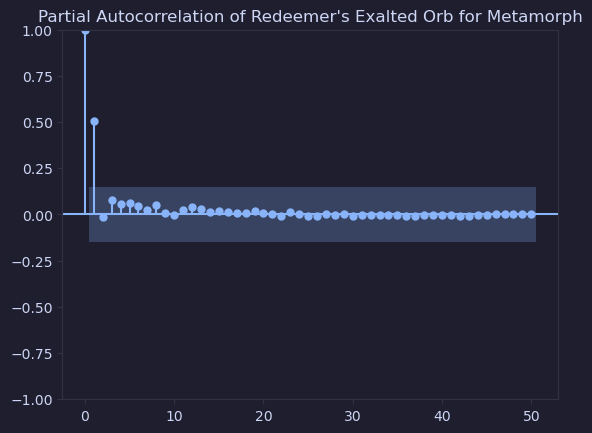

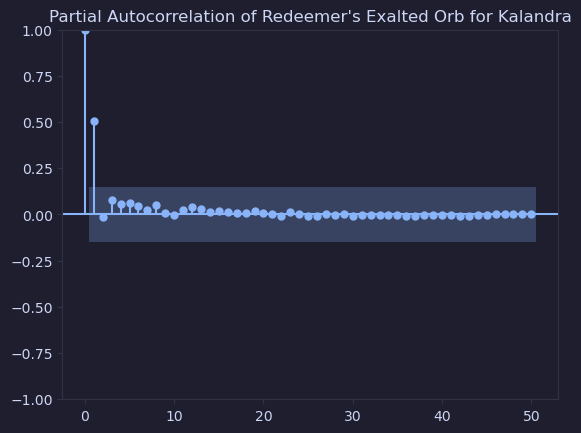

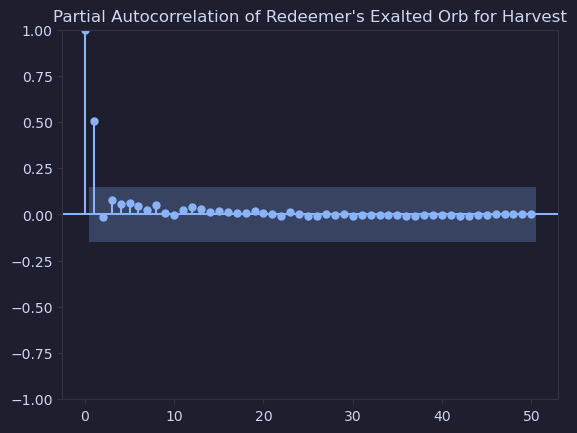

...

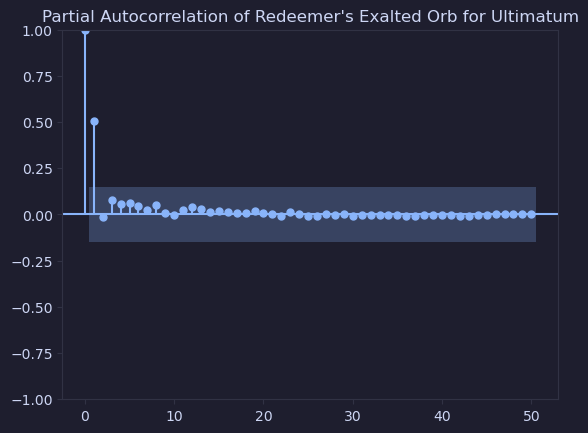

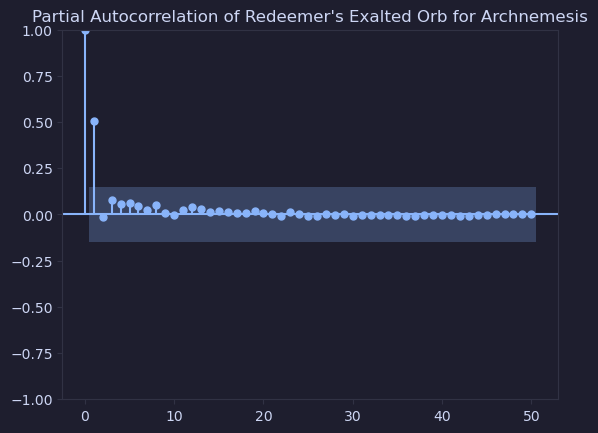

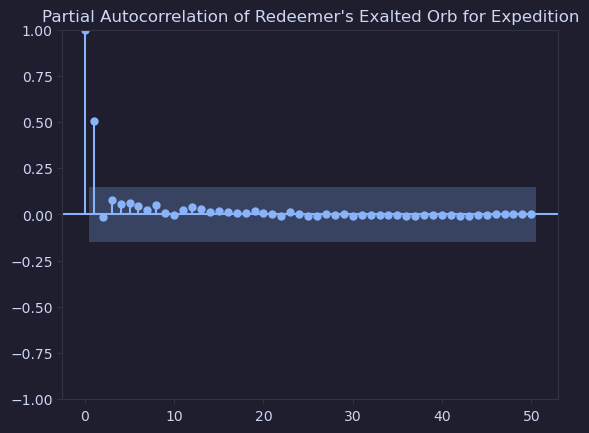

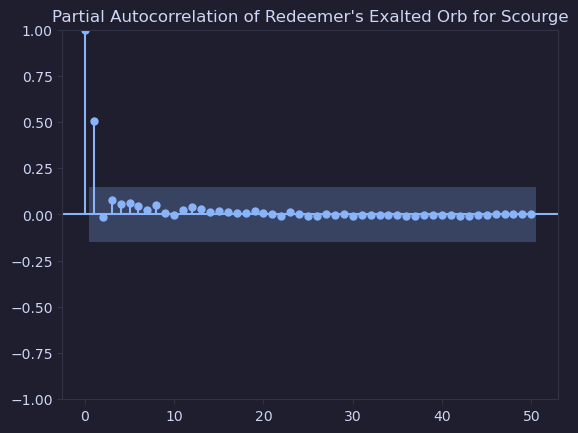

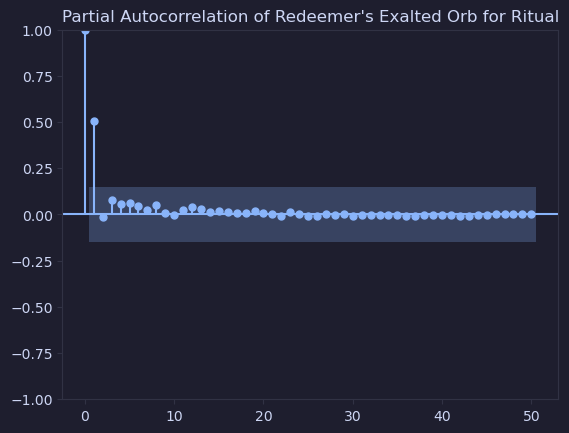

<Figure size 1600x800 with 0 Axes>

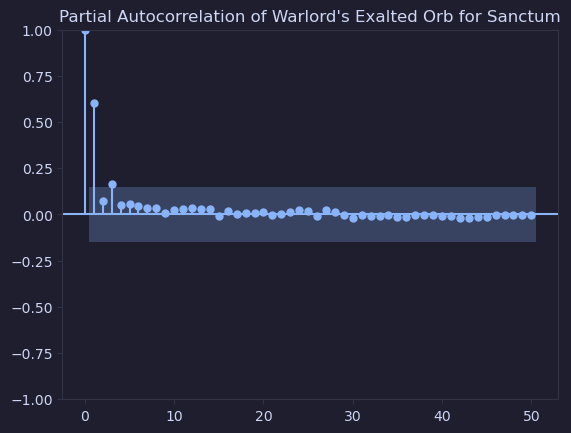

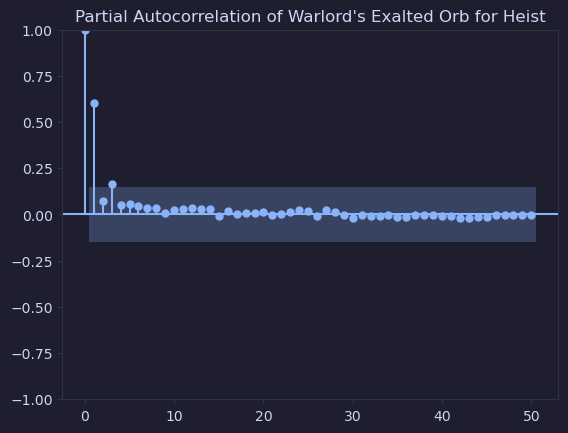

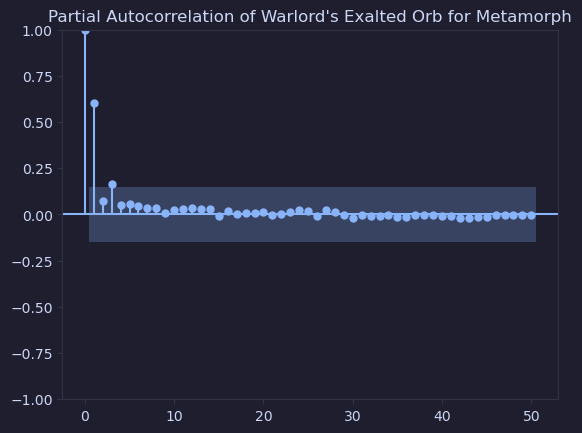

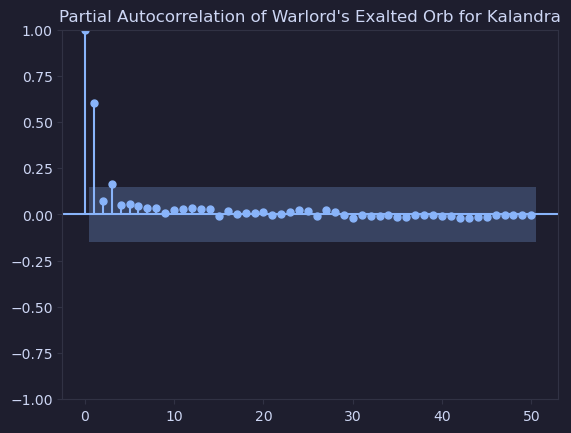

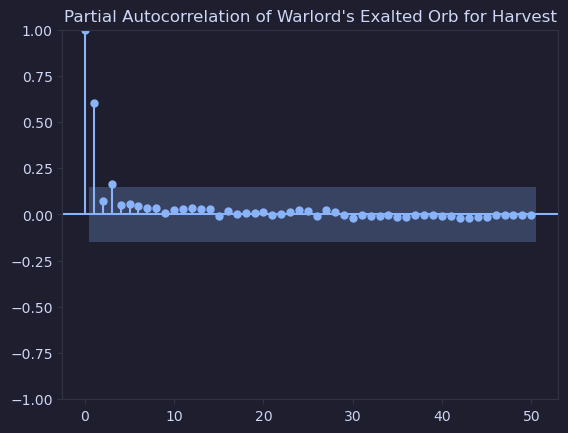

...

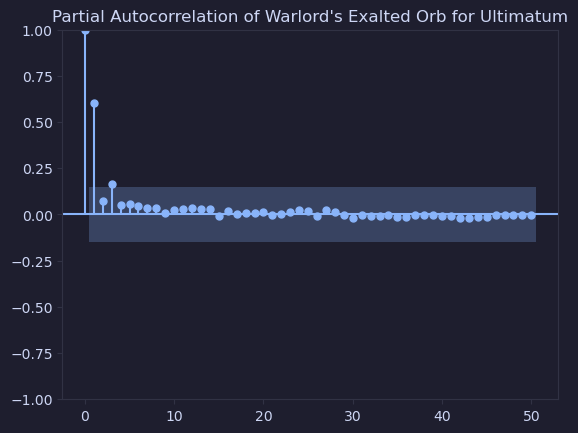

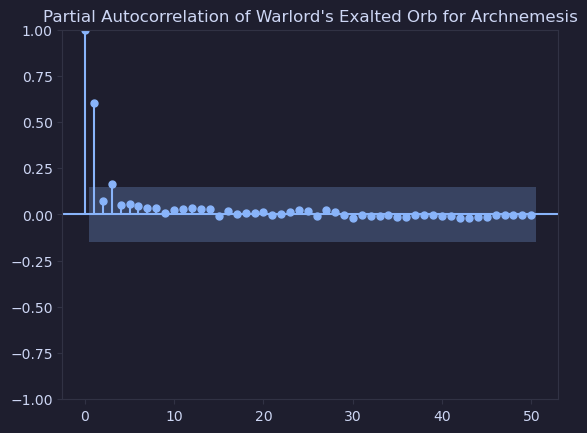

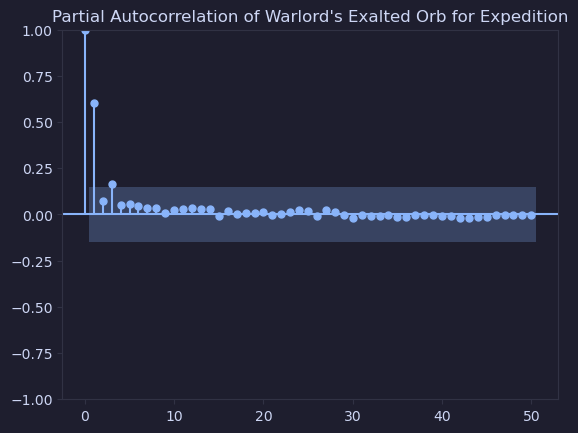

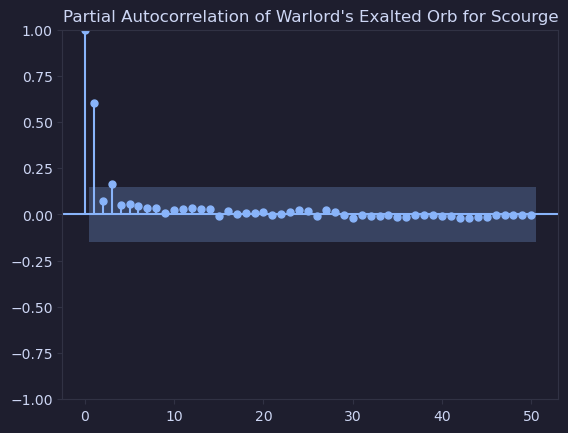

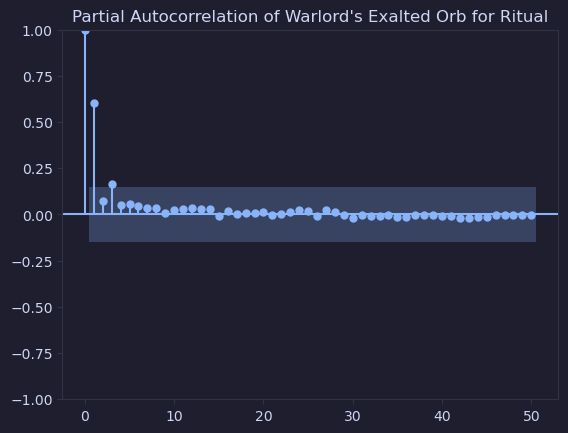

<Figure size 1600x800 with 0 Axes>

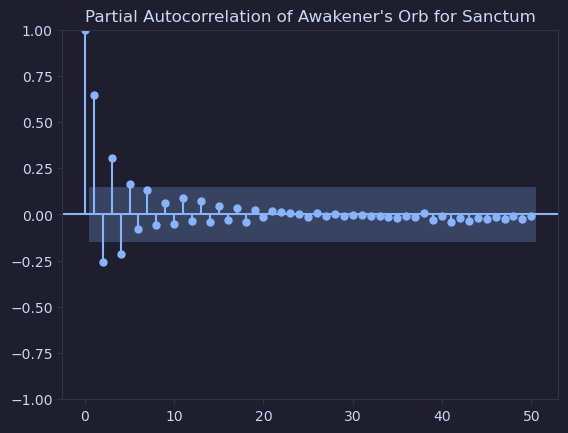

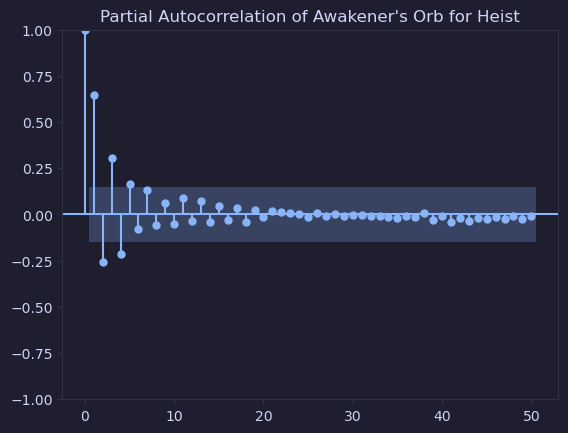

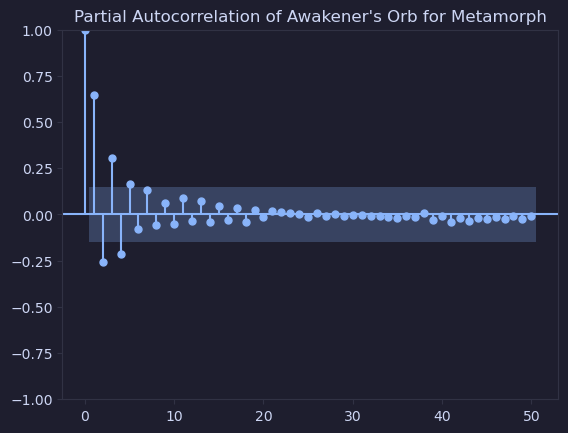

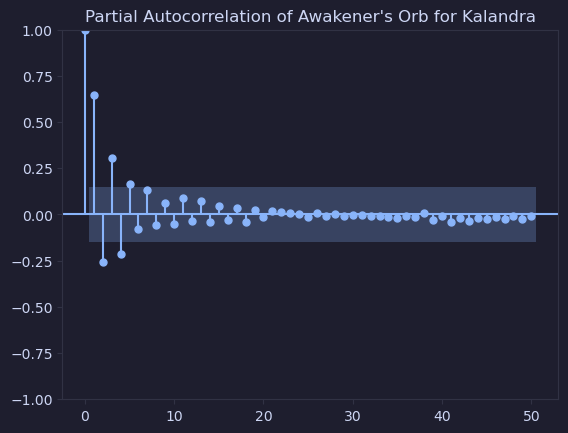

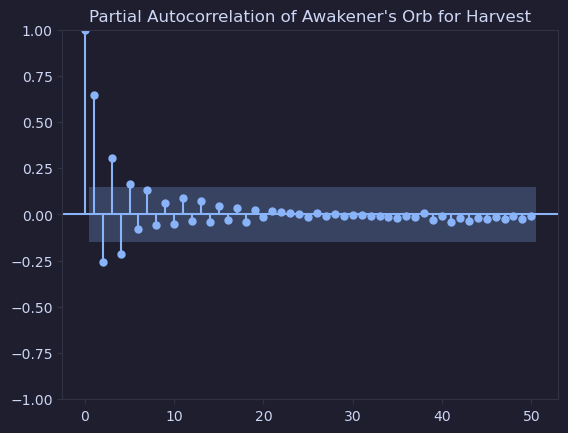

...

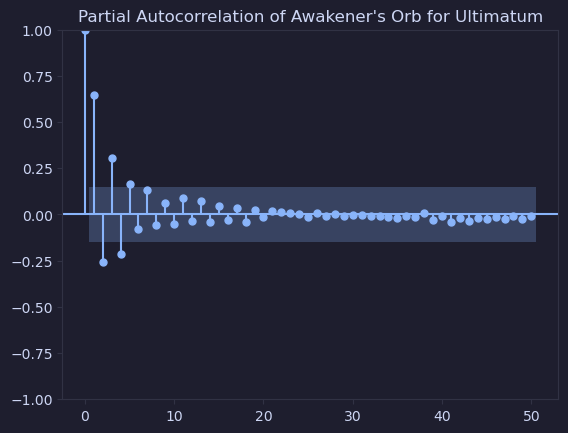

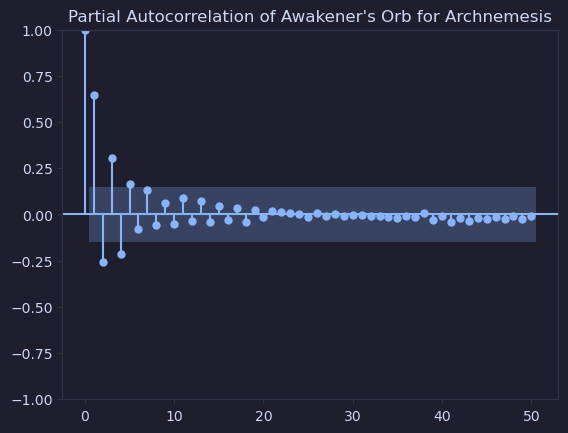

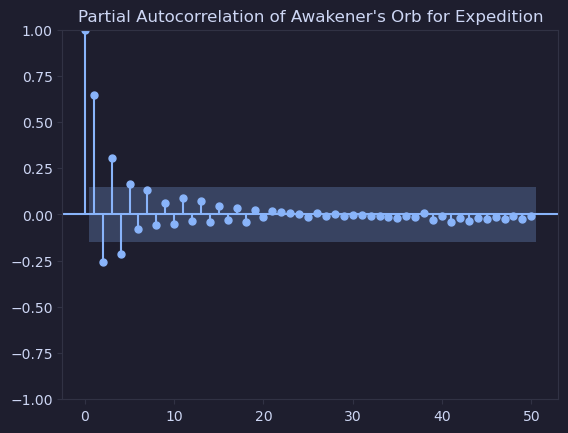

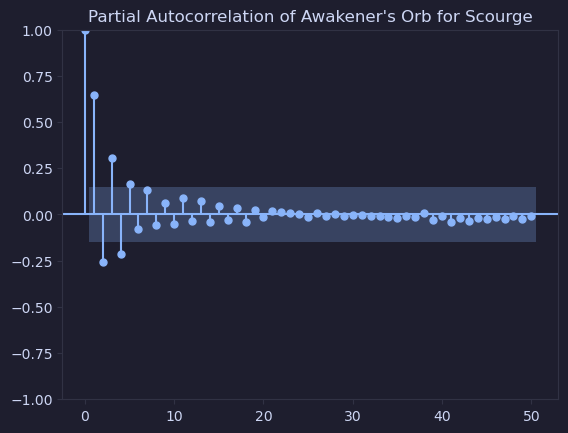

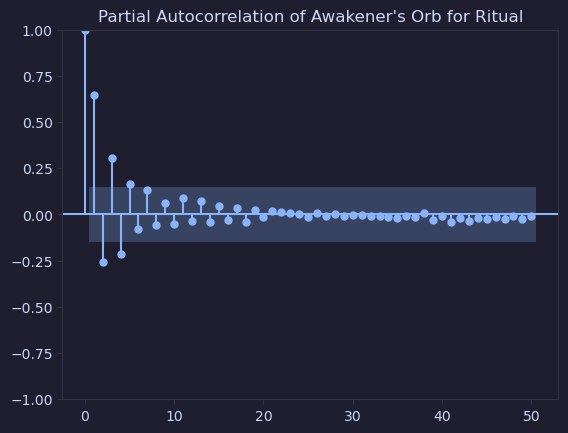

In [18]:
for currency in currencies:
    league_partial_auto_correlation(currency)

The currencies typically are high correlated with their most immediate previous value and the correlation quickly dies down after that. There does not seem to be much seasonality.

## Standard

Just like how we looked above into the values of the currencies in the various challenge leagues, lets look at the standard league. 

Let's start again by looking at the values over time, their moving averages, and the differences and differences of differences.

In [19]:
def standard_graph(currency, rolling=0, diffs=0):
    '''
    This is a similar function to the graphing function we had before, but instead is designed around the standard league, which is permanent, and therefore
    is a more traditional time series data set.
    
    currency: target currency to be graphed
    rolling: default = 0. Used to set the window for moving average
    diffs: default = 0. Used to the differencing desired.
    '''
    plt.figure(figsize=(16,8))
    
    df = league_df(currency=currency)
    df = trade_ratio(df)
    df = average_ratio(df)
    df.set_index('Date', inplace=True)
    df.sort_index(inplace=True)
    df = df.resample('W').mean()

    if rolling>0:
        df['Ratio'] = df['Ratio'].rolling(window=rolling).mean(numeric_only=True)
            
    if diffs>0:
        for i in range(0, diffs):
            df['Ratio'] = df['Ratio'].diff()

    plt.plot(
        df['Ratio'],
    )
    
    if rolling>0:
        roll_str = f' Moving Average ({rolling})'
    else:
        roll_str = ''
        
    diffs_str = ''
    
    if diffs>0:
        for i in range(0, diffs):
            diffs_str += 'Differenced '
   
    plt.title(f'Chaos Orb to {currency}{roll_str} {diffs_str}Ratio in standard')
    plt.xlabel('Date')
    plt.ylabel('Chaos Trade Ratio')
    
    if rolling>0:
        plt.savefig(f'../images/{currency}_moving_standard.png')
    elif diffs>0:
        for i in range(0, diffs):
            diffs_str = 'diff_'
        plt.savefig(f'../images/{currency}_{diffs_str}standard.png')
    else:
        plt.savefig(f'../images/{currency}_standard.png')
 
    plt.show;

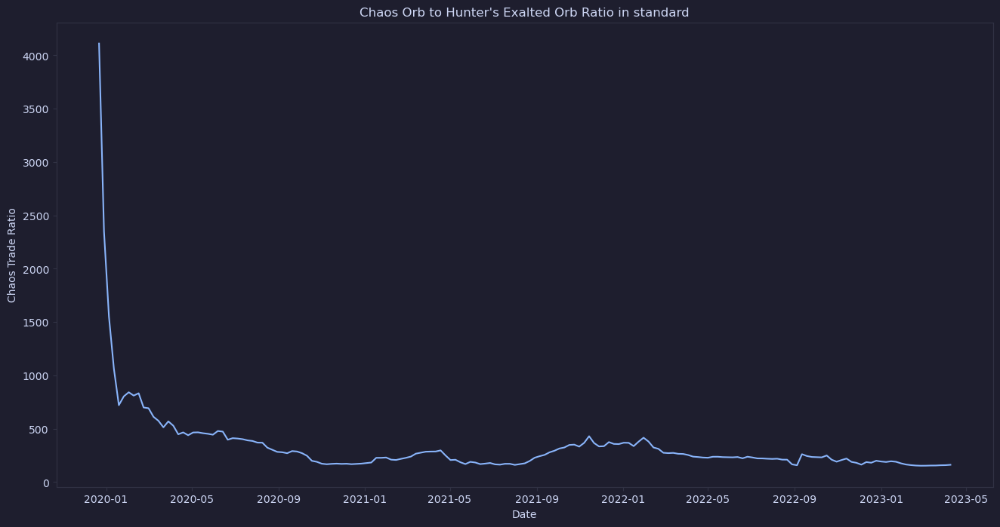

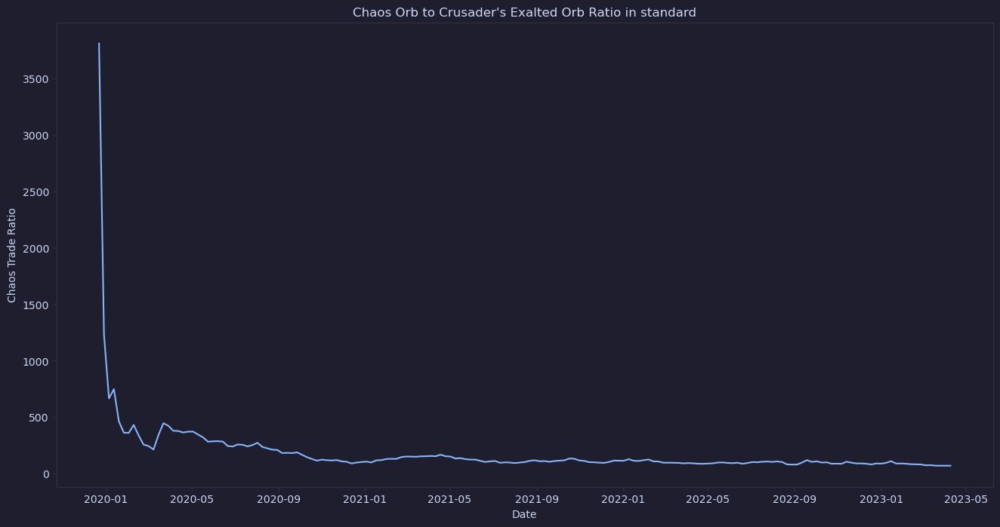

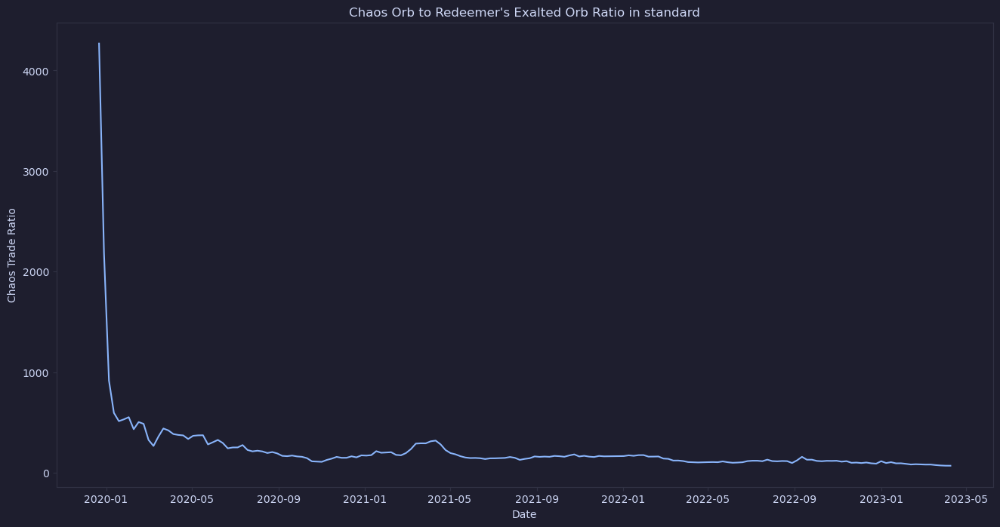

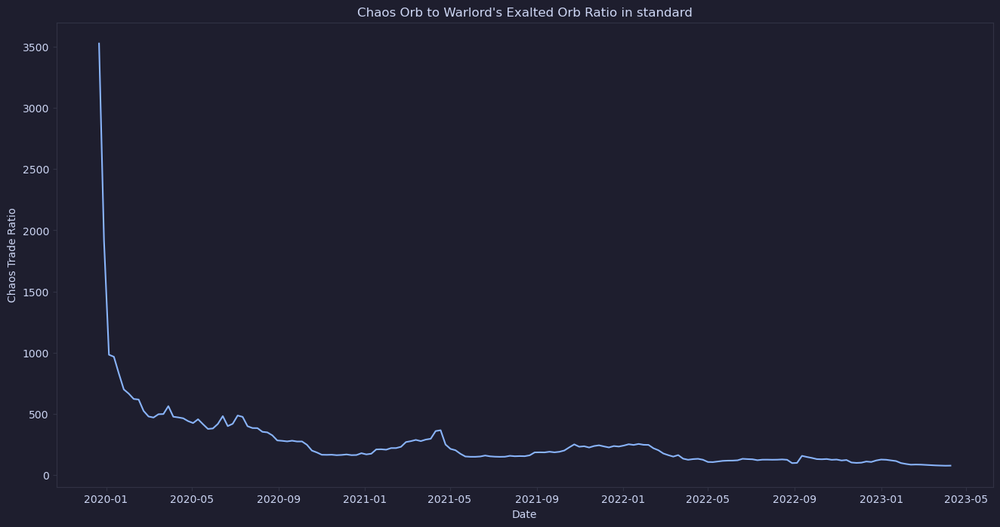

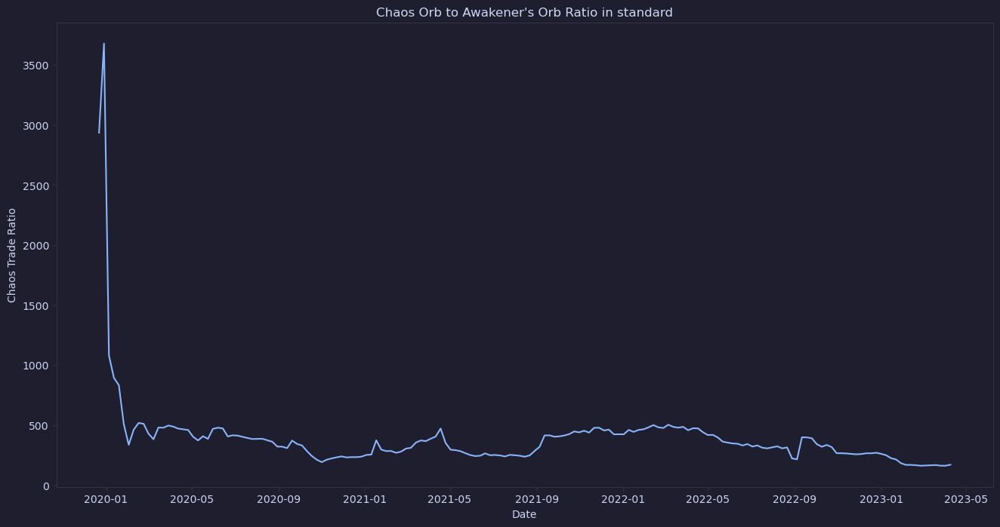

In [20]:
for currency in currencies:
    standard_graph(currency)

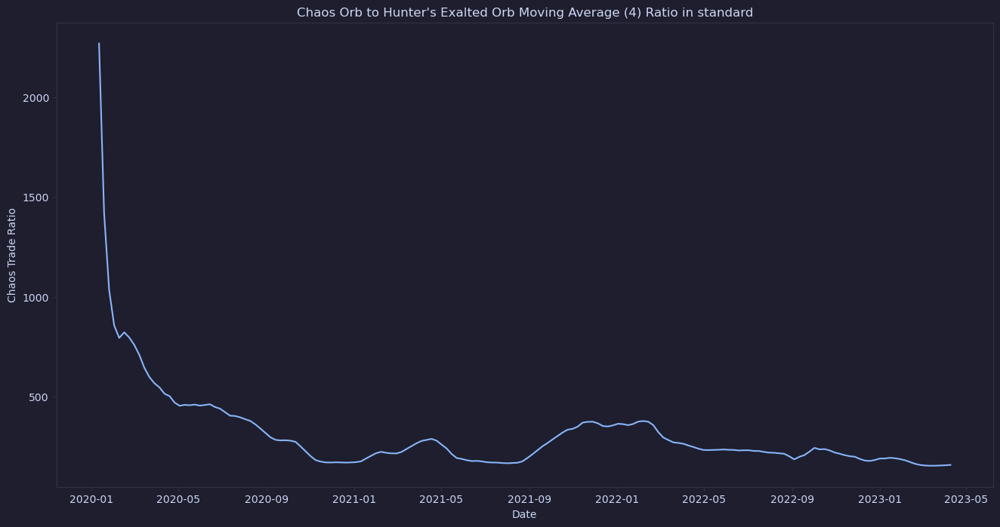

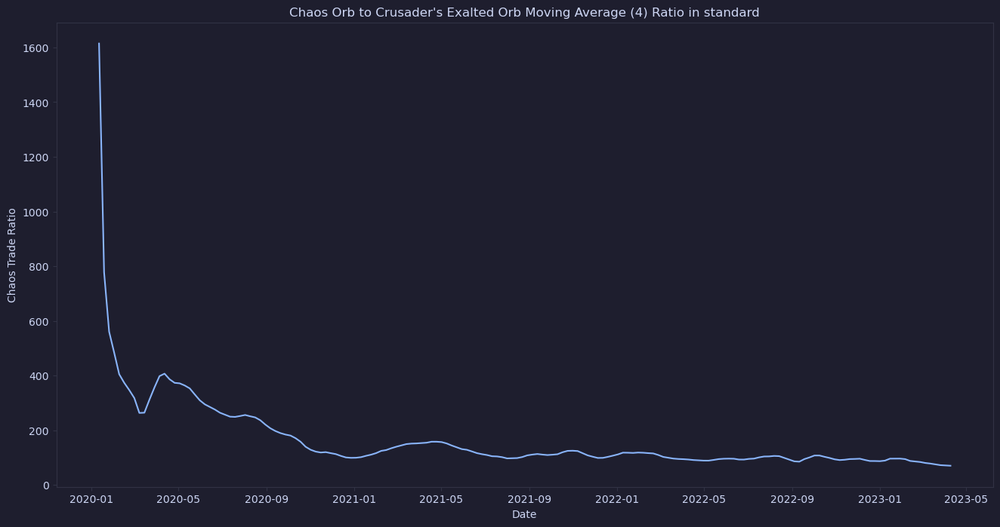

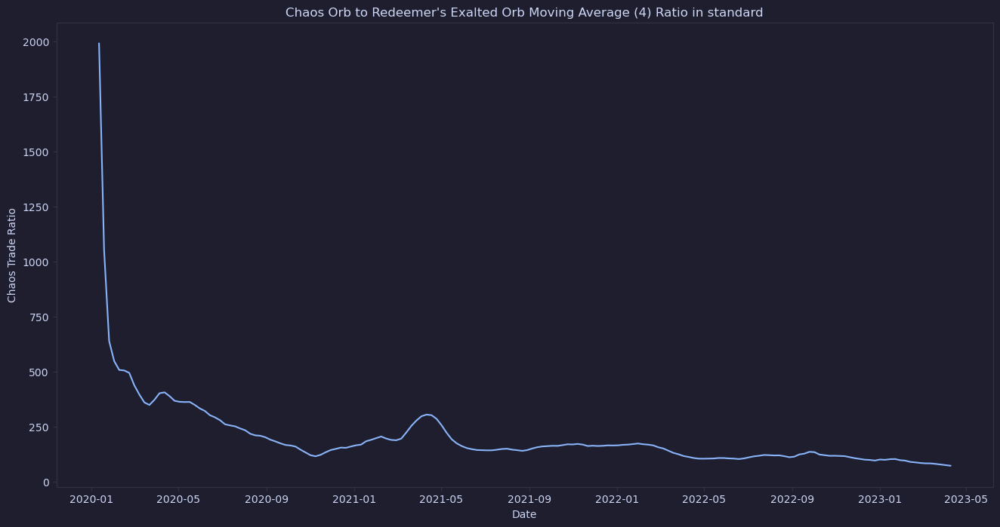

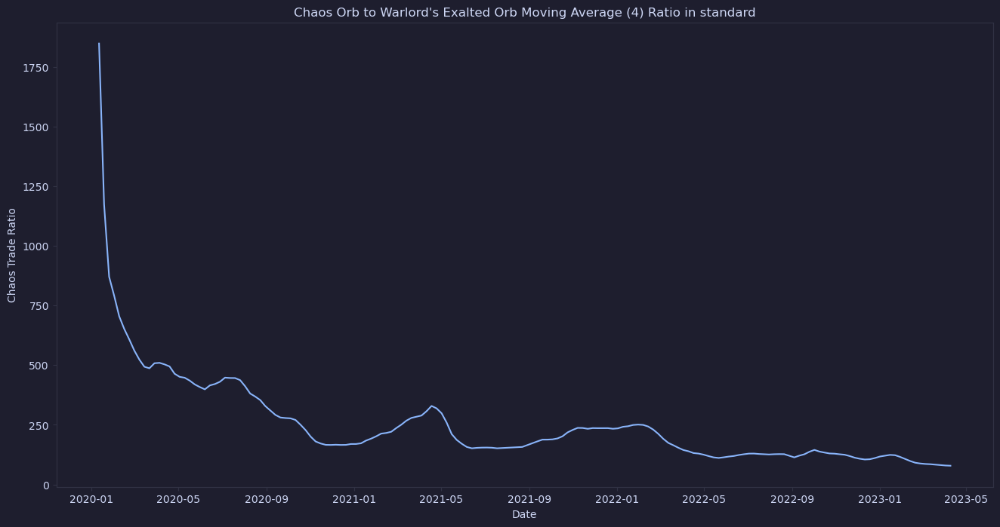

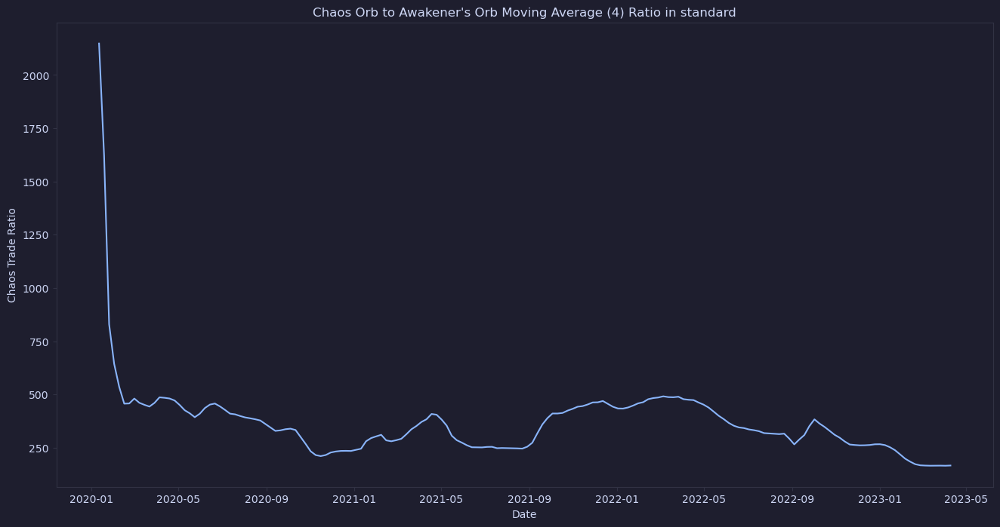

In [21]:
for currency in currencies:
    standard_graph(currency, rolling=4)

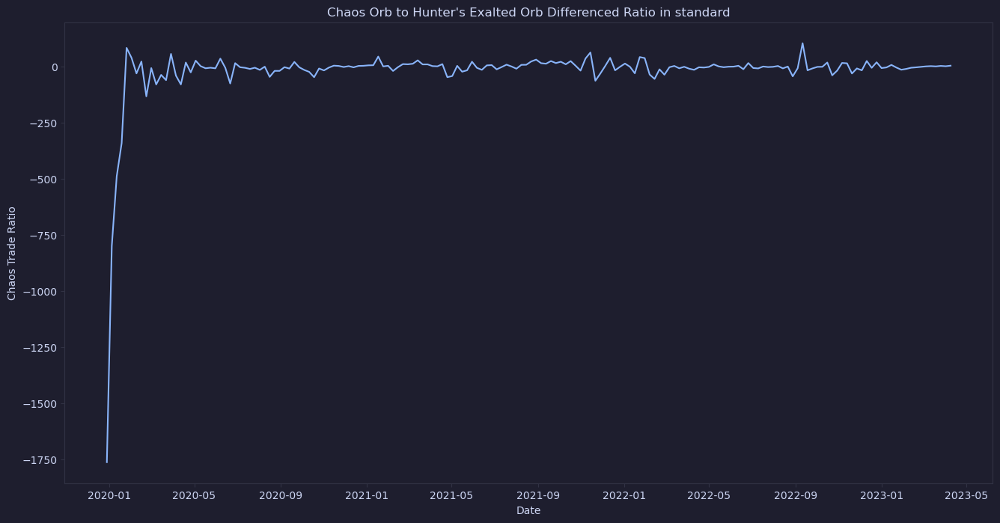

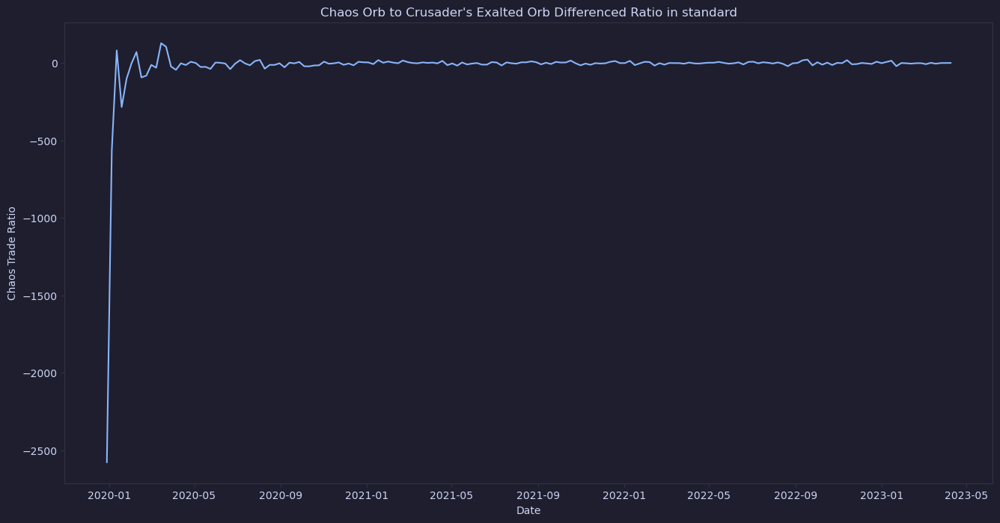

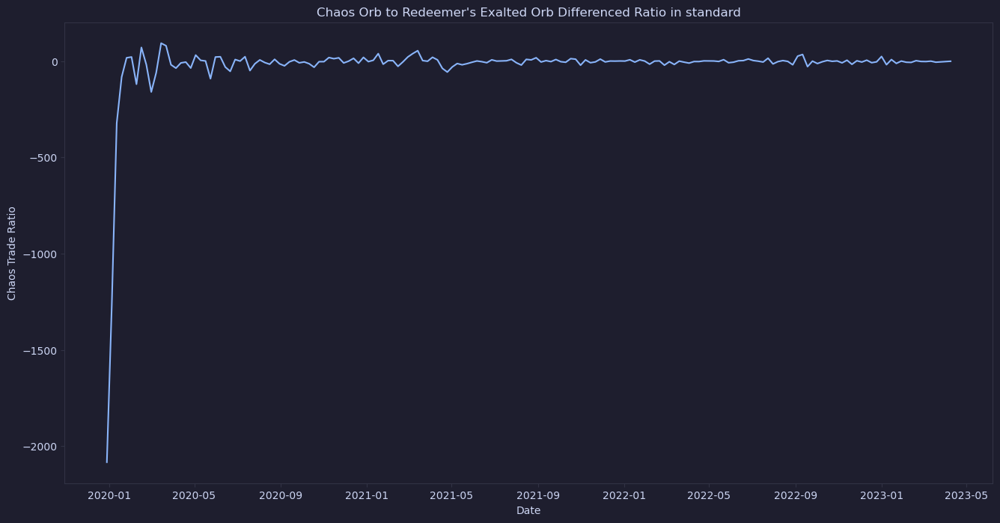

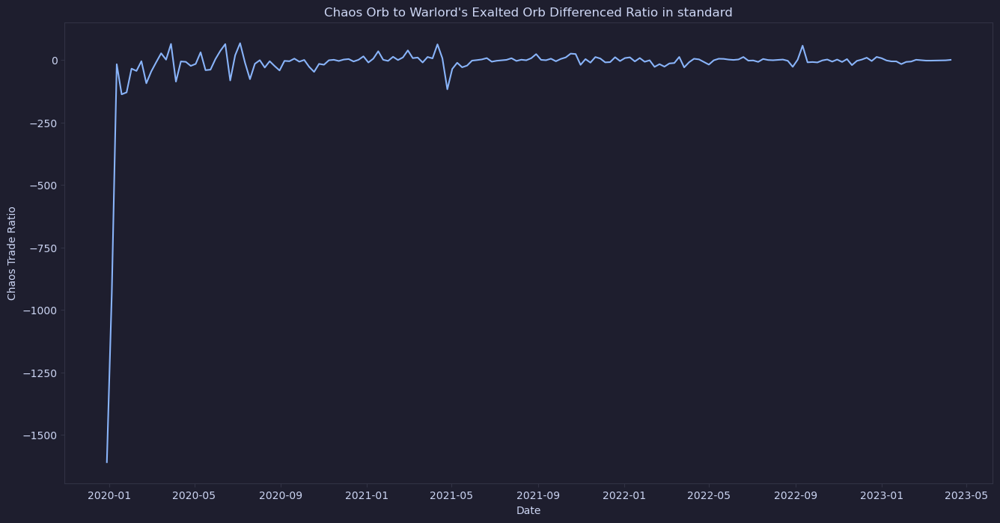

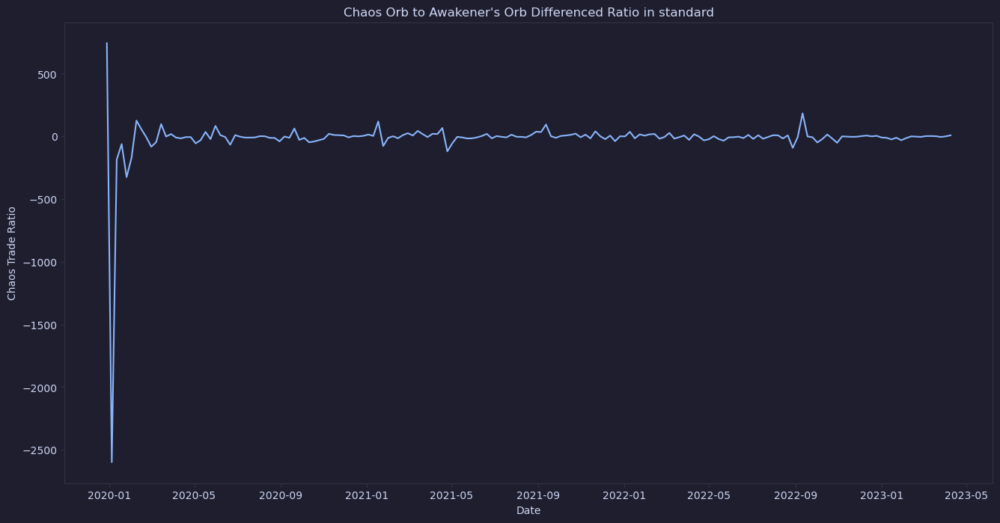

In [22]:
for currency in currencies:
    standard_graph(currency, diffs=1)

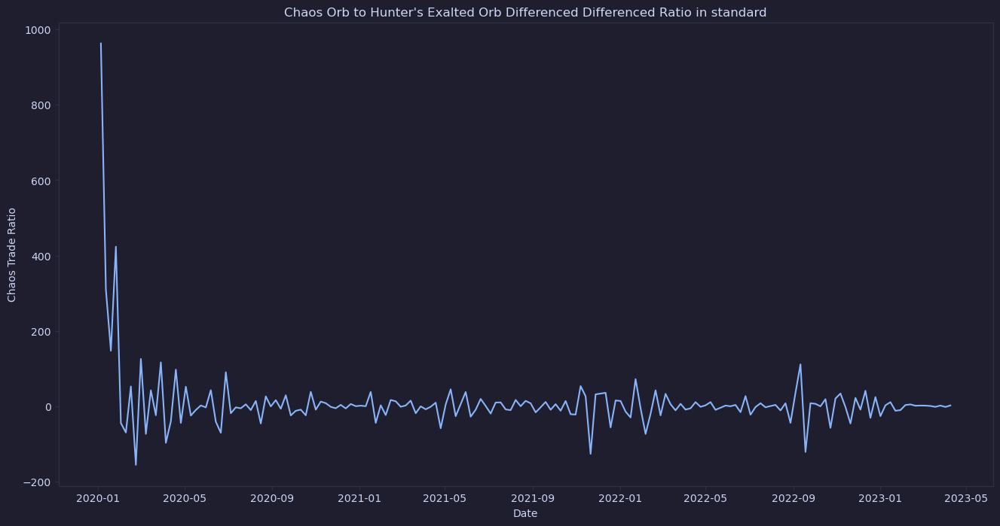

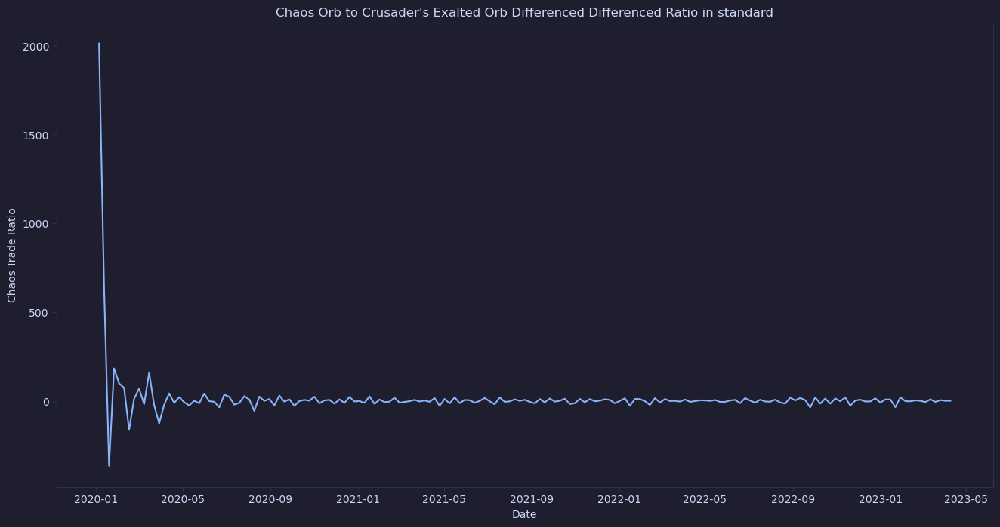

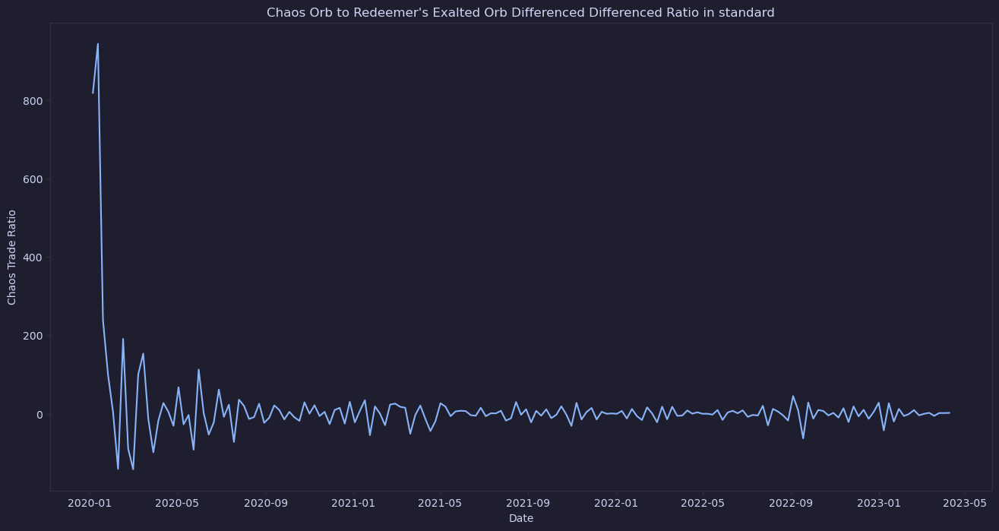

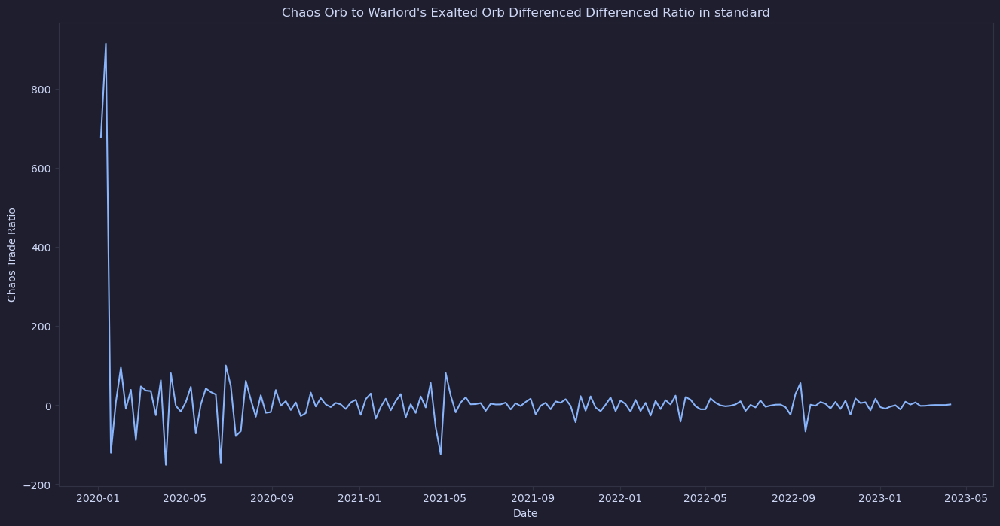

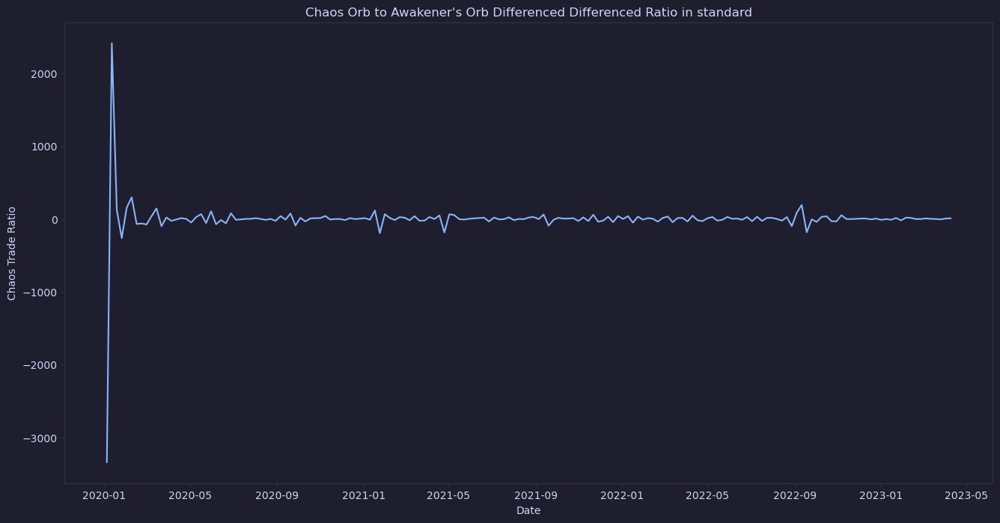

In [23]:
for currency in currencies:
    standard_graph(currency, diffs=2)

The interesting aspect of these currencies is that they start at INCREDIBLY inflated prices when they were first introduced due to not many existing on the market for the first day or so and there being a huge amount of currency in the market as a whole. However, those prices drop fast as people discover the rarity of the new currencies and the prices stabalize.They don't move around too much over time.

We can again look at the correlation of the values with their previous values again.

In [24]:
def standard_auto_correlation(currency):
    '''
    This function plots the Auto Correlation Function Graph for a specified currency for Standard League
    
    currency: Specified Currency.
    lags: default = 50. The number of lags the function should look through.
    '''   
    df = league_df(currency=currency)
    df = trade_ratio(df)
    df = average_ratio(df)
    df.set_index('Date', inplace=True)
    df.sort_index(inplace=True)
    df = df.resample('W').mean()
    
    plot_acf(df['Ratio'], lags = 50, title=f'Autocorrelation of {currency}');

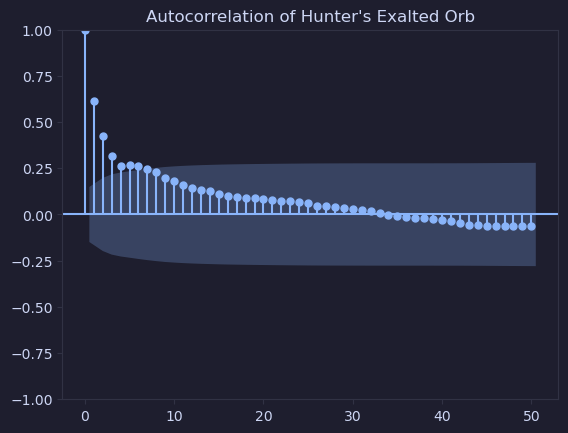

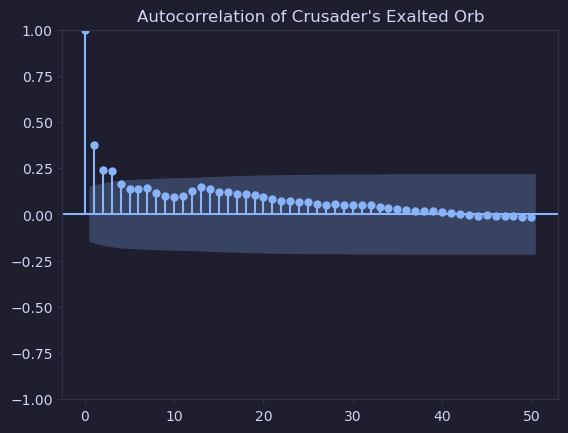

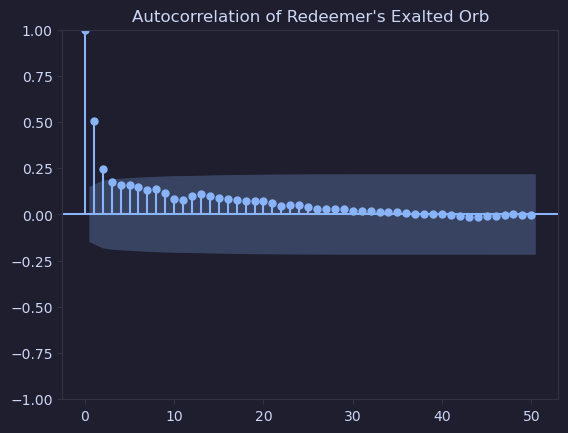

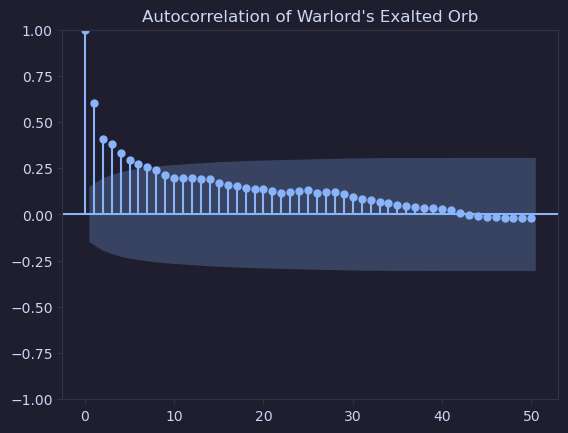

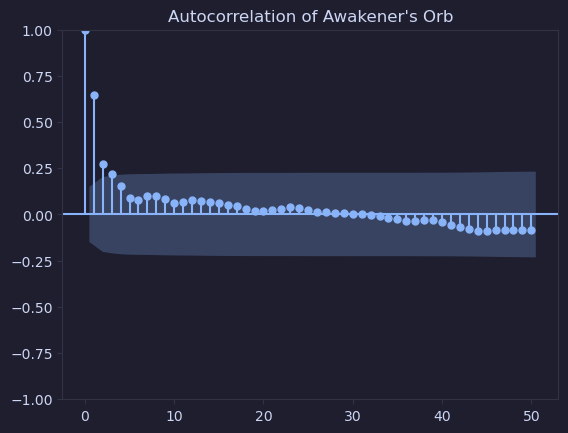

In [25]:
for currency in currencies:
    standard_auto_correlation(currency)

In [26]:
def standard_partial_auto_correlation(currency):
    '''
    This function plots the Partial Auto Correlation Function Graph for a specified currency for Standard League
    
    currency: Specified Currency.
    lags: default = 50. The number of lags the function should look through.
    '''   
    df = league_df(currency=currency)
    df = trade_ratio(df)
    df = average_ratio(df)
    df.set_index('Date', inplace=True)
    df.sort_index(inplace=True)
    df = df.resample('W').mean()
    
    plot_pacf(df['Ratio'], lags = 50, method = 'ywm', title=f'Partial Autocorrelation of {currency}');

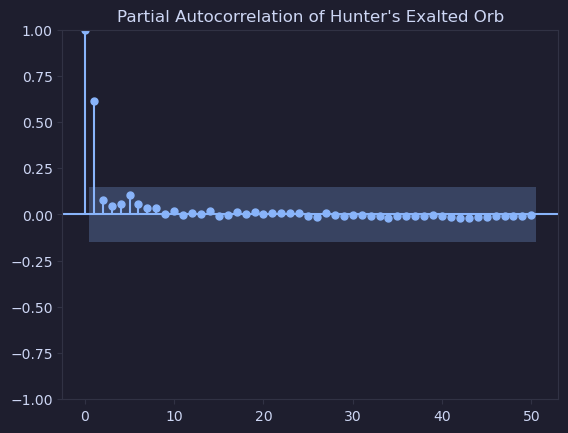

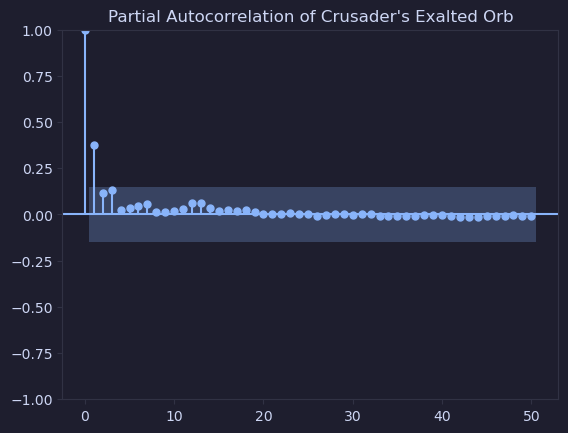

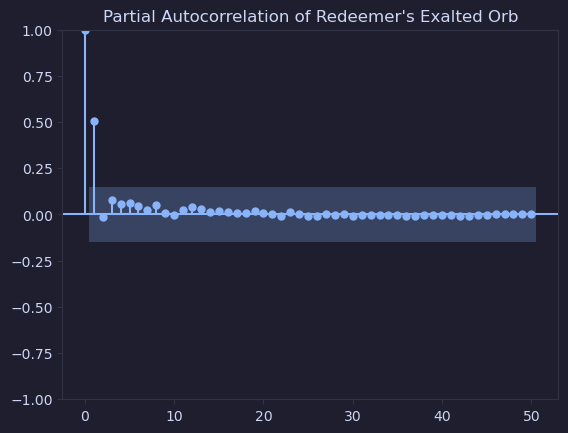

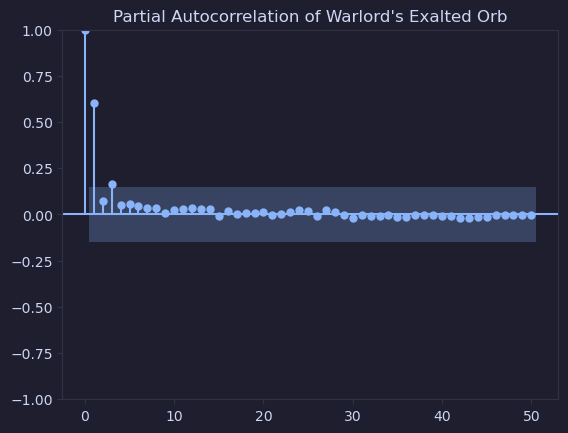

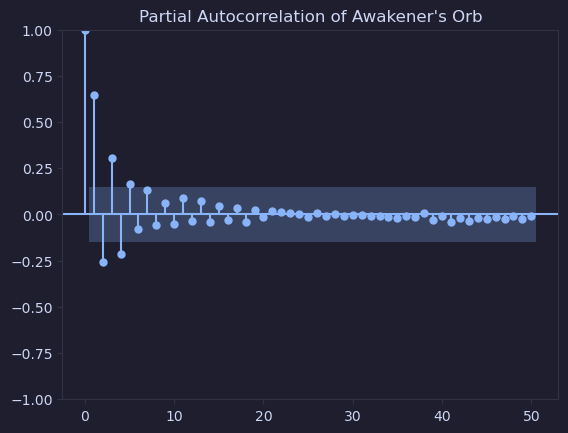

In [27]:
for currency in currencies:
    standard_partial_auto_correlation(currency)

Surprisingly, even with the typical influx of currency at the end of every challenge league, there doesn't seem to be a seasonal pattern in the data.